In [1]:
import os, sys

import pandas as pd
import numpy as np
from math import log2
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from numpy.random import randint
import matplotlib.pyplot as plt
from scipy.stats import pearsonr


labelnames = ['adrenal', 'brain', 'breast', 'colorectal', 'kidney', 'leukemia', 'liver',
 'lung', 'melanoma', 'ovary', 'pancreas', 'prostate', 'sarcoma', 'squamous',
 'stomach', 'testes', 'thymus', 'thyroid', 'uterus']

In [2]:
df = pd.read_csv("data/exToptimizedtrain.csv")
bindf = pd.read_csv("data/trainbindata.csv")

In [3]:
plt.style.use('dark_background')

In [4]:
def NarrowToTwoLabels(label1, label2):
    classlist = list(df['labels'])
    indexlist = list()
    for i in range(len(classlist)):
        if classlist[i] == label1 or classlist[i] == label2:
            indexlist.append(i)
    return indexlist

def Aggregate(index, featurenames, reverse):
    sum = 0
    for i in range(len(featurenames)):
        value = list(df[featurenames[i]])[index]
        if reverse[i] == 0:
            sum += value
        else:
            sum -= value
    return sum

In [5]:
def InfoGain(featurelist, classlist, classentropy):
    featurenum = len(np.unique(featurelist))
    classnum = len(np.unique(classlist))
    length = len(featurelist)

    entropy = 0
    for i in range(featurenum):
        featurecount = 0
        for j in range(length):
            if featurelist[j] == i:
                featurecount += 1
        for c in range(classnum):
            cellentropy = 0
            count = 0
            for j in range(length):
                if (featurelist[j] == i) and (classlist[j] == c):
                    count += 1
            if count != 0:
                ratio = count / featurecount
                cellentropy -= ratio * log2(ratio)
                entropy += cellentropy * (featurecount / length)
    return classentropy - entropy
    

def graphpairfeature(featurename, label1, label2, indexlist):
    classlist = list(df['labels'])
    featurelist = list(df[featurename])
    graphfeaturelist = list()
    graphclasslist = list()
        
    for i in indexlist:
        graphfeaturelist.append(featurelist[i])
        graphclasslist.append(classlist[i])
        
    graphindex = 50
    for i in range(len(graphclasslist)):
        if graphclasslist[i] == label1:
            graphclasslist[i] = graphindex
            graphindex += 1
    graphindex += 50
    for i in range(len(graphclasslist)):
        if graphclasslist[i] == label2:
            graphclasslist[i] = graphindex
            graphindex += 1
    markersizelist = [10] * len(graphclasslist)
    plt.scatter(graphclasslist, graphfeaturelist, s=markersizelist)
    plt.title(featurename)
    plt.ylabel('Feature Value')
    plt.xlabel('Iteration split by label')
    plt.show()



def graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist):

    print(featurenamelist)
    print(reverse)

    #Handle aggregate creation
    graphfeaturelist = list()
    for i in indexlist:
        graphfeaturelist.append(list(df[featurenamelist[0]])[i])
    for i in range(len(featurenamelist) - 1):
        tmplist = list(df[featurenamelist[i + 1]].copy())
        copylist = list()
        for j in indexlist:
            copylist.append(tmplist[j])

        for j in range(len(graphfeaturelist)):
            if reverse[i + 1] == 0:
                graphfeaturelist[j] += copylist[j]
            else:
                graphfeaturelist[j] -= copylist[j]
    
    #Handle class list creation
    graphclasslist = list()
    for i in indexlist:
        graphclasslist.append(df['labels'][i])
        
    #prepare graph values
    graphindex = 50
    for i in range(len(graphclasslist)):
        if graphclasslist[i] == label1:
            graphclasslist[i] = graphindex
            graphindex += 1
    graphindex += 50
    for i in range(len(graphclasslist)):
        if graphclasslist[i] == label2:
            graphclasslist[i] = graphindex
            graphindex += 1
            
    markersizelist = [10] * len(graphclasslist)
    plt.scatter(graphclasslist, graphfeaturelist, s=markersizelist)
    plt.title("Aggregate")
    plt.ylabel('Feature Value')
    plt.xlabel('Iteration split by label')
    plt.show()

    
def top5correlatedfeatures(featurename, indexlist):
    topfeaturelist = list()
    classlist = list()
    for i in indexlist:
        classlist.append(list(df['labels'])[i])
        topfeaturelist.append(list(df[featurename])[i])
    correlationlist = list()
    for i in range(1, len(df.columns)):
        if df.columns[i] == featurename:
            correlationlist.append(0.0)
        else:
            tmplist = list(df[df.columns[i]])
            featurelist = list()
            for j in indexlist:
                featurelist.append(tmplist[j])
            corr, _ = pearsonr(topfeaturelist, featurelist)
            correlationlist.append(corr)
        if (i % 2000) == 0:
            print("Correlation:", i)
    returnlist = list()
    returnlist.append(featurename)
    reverse = [0]
    for j in range(5):
        max = 0
        maxindex = -1
        for i in range(len(correlationlist)):
            if abs(correlationlist[i]) > max:
                max = abs(correlationlist[i])
                maxindex = i
        if correlationlist[maxindex] < 0:
            reverse.append(1)
        else:
            reverse.append(0)
        returnlist.append(df.columns[maxindex + 1])
        correlationlist[maxindex] = 0
    return returnlist, reverse



def plottop5features(label1, label2, indexlist):
    classlist = list()

    #Original label list
    tmplabel = list(df['labels'])

    #Creating classlist which narrows down the classes to two labels
    for i in indexlist:
        if tmplabel[i] == label1:
            classlist.append(0)
        if tmplabel[i] == label2:
            classlist.append(1)
            
    #Calculating the entropy for the class to speed up the info gain function
    classnum = 2
    classprob = [0] * classnum
    for l in classlist:
        classprob[l] += 1
    classentropy = 0
    for i in range(classnum):
        classprob[i] = classprob[i] / len(classlist)
        classentropy -= classprob[i] * log2(classprob[i])


    #Get list of info gain values between each feature and classification
    infoGain = list()
    for i in range(1, len(df.columns)):
        featurelist = list()
        tmpfeature = list(bindf[bindf.columns[i]])
        for k in indexlist:
            featurelist.append(tmpfeature[k])
        infoGain.append(InfoGain(list(LabelEncoder().fit_transform(featurelist)), classlist, classentropy))
        if (i % 1000) == 0:
            print("i = ", i)

    print("Starting to print graphs")
    for k in range(5):
        max = -1
        maxindex = -1
        for i in range(len(infoGain)):
            if infoGain[i] > max:
                max = infoGain[i]
                maxindex = i
        infoGain[maxindex] = -1
        topfeature = df.columns[maxindex + 1]
        print("Top feature ", topfeature, " index ", k)
        featurenames, reverse = top5correlatedfeatures(topfeature, indexlist)
        for i in featurenames:
            graphpairfeature(i, label1, label2, indexlist)
        graphpairaggregate(featurenames, reverse, label1, label2, indexlist)
    return

In [6]:
def featureindex(featurename):
    featurelist = list(df.columns)
    for i in range(len(featurelist)):
        if featurelist[i] == featurename:
            return i + 1

In [ ]:
#Template
label1 = 0
label2 = 1
#featurename = 'GRHL2'
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
indexlist = NarrowToTwoLabels(label1, label2)
plottop5features(label1, label2, indexlist)

#graphpairfeature(featurename, label1, label2, indexlist)
#graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]
    v = Aggregate(i, featurenamelist, reverse)

    if v < -1:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurename = 'EEF1A2'
graphpairfeature(featurename, label1, label2, indexlist)


featurenamelist = ['GFAP', 'FAM181A', 'WDR49', 'CHI3L1', 'SOX21', 'BCAS1']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: adrenal  and  brain


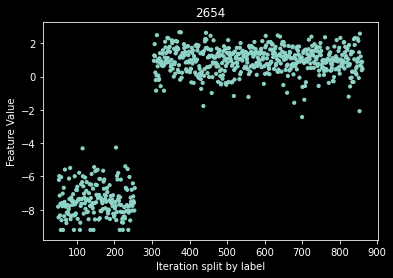

In [121]:
label1 = 0
label2 = 1
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2654'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  breast


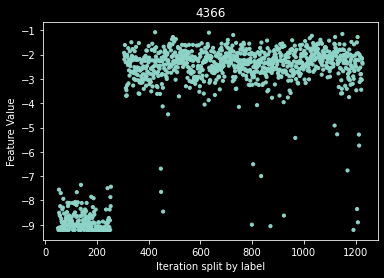

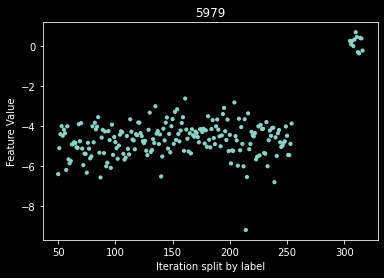

In [122]:
label1 = 0
label2 = 2
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '4366'
graphpairfeature(featurename, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]

    if v < -6.5:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#first feature
featurename = '5979'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  colorectal


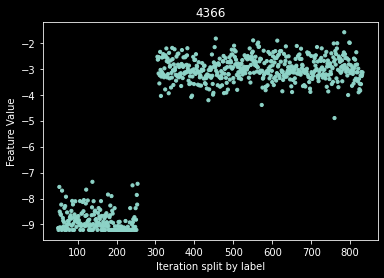

In [123]:
label1 = 0
label2 = 3
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '4366'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  kidney
['11658', '8543', '3066', '8177', '3076', '6598']
[0, 0, 0, 0, 0, 0]


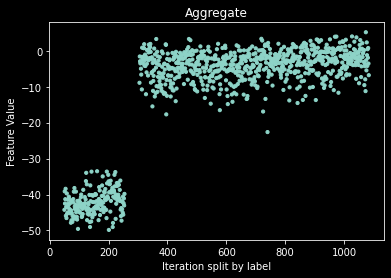

In [124]:
label1 = 0
label2 = 4
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurenamelist = ['11658', '8543', '3066', '8177', '3076', '6598']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: adrenal  and  leukemia


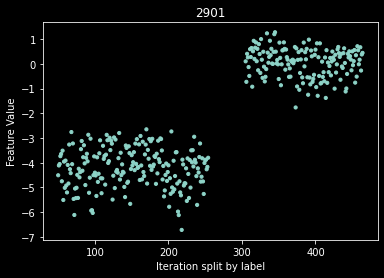

In [125]:
label1 = 0
label2 = 5
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2901'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  liver


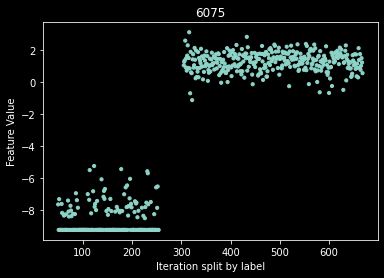

In [126]:
label1 = 0
label2 = 6
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '6075'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  lung


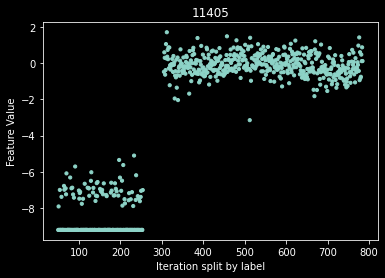

In [127]:
label1 = 0
label2 = 7
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '11405'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  melanoma
['6075', '9186', '4929', '12127', '8061', '12181']
[0, 0, 0, 0, 0, 0]


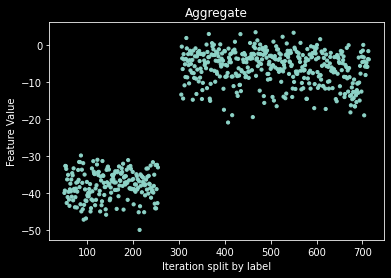

In [128]:
label1 = 0
label2 = 8
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurenamelist = ['6075', '9186', '4929', '12127', '8061', '12181']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: adrenal  and  ovary


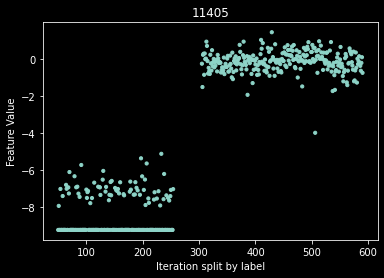

In [129]:
label1 = 0
label2 = 9
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '11405'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  pancreas


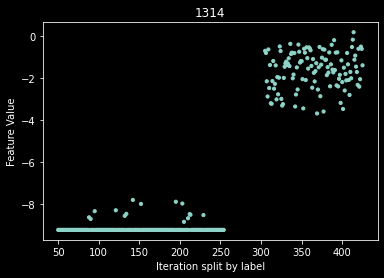

In [130]:
label1 = 0
label2 = 10
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '1314'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  prostate


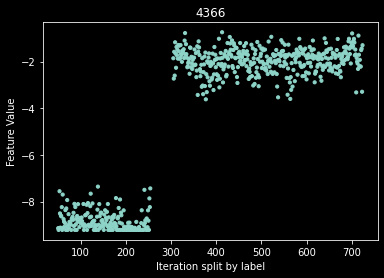

In [131]:
label1 = 0
label2 = 11
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '4366'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  sarcoma
['10572', '6762', '6908', '668', '9186', '12385']
[0, 0, 0, 0, 0, 0]


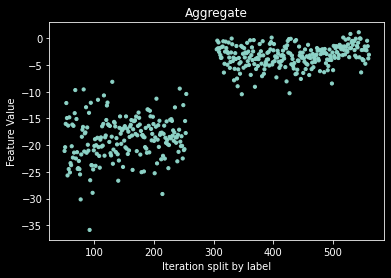

['6431', '2975', '10602', '5681', '3463', '5503']
[0, 1, 1, 1, 1, 1]


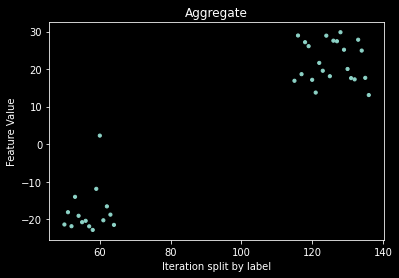

In [132]:
label1 = 0
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurenamelist = ['10572', '6762', '6908', '668', '9186', '12385']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = Aggregate(i, featurenamelist, reverse)

    if v < -6 and v > -13:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurenamelist = ['6431', '2975', '10602', '5681', '3463', '5503']
reverse = [0, 1, 1, 1, 1, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: adrenal  and  squamous


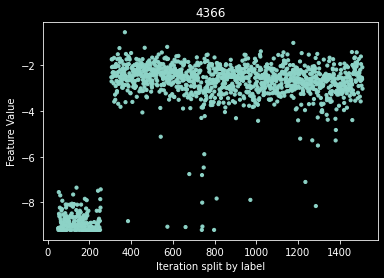

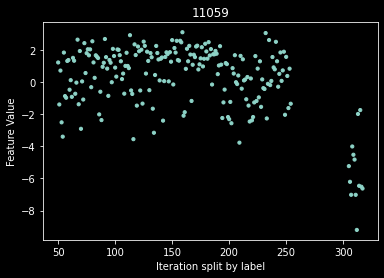

In [133]:
label1 = 0
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '4366'
graphpairfeature(featurename, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]

    if v < -6.5:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#first feature
featurename = '11059'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  stomach


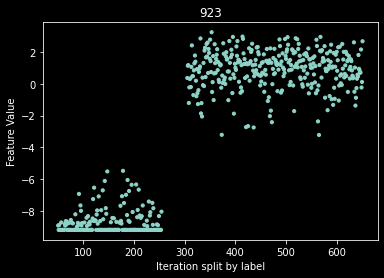

In [134]:
label1 = 0
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '923'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  testes


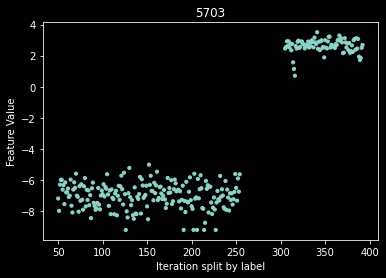

In [135]:
label1 = 0
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '5703'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  thymus


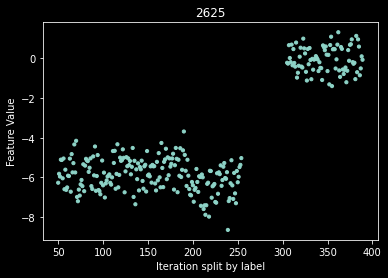

In [136]:
label1 = 0
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2625'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  thyroid


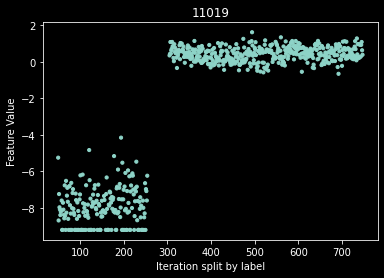

In [137]:
label1 = 0
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '11019'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: adrenal  and  uterus


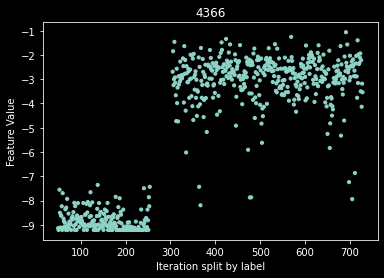

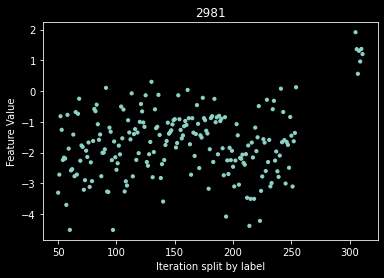

In [138]:
label1 = 0
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '4366'
graphpairfeature(featurename, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]

    if v < -6.5:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#first feature
featurename = '2981'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  breast


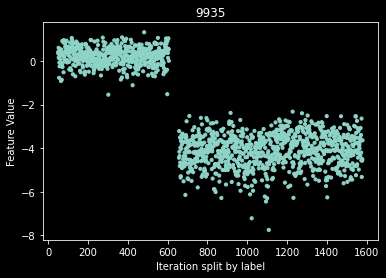

In [139]:
label1 = 1
label2 = 2
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9935'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  colorectal


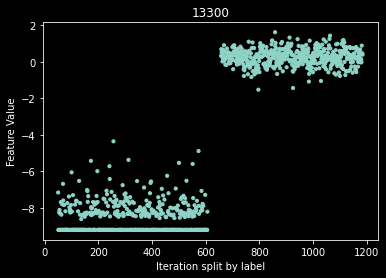

In [140]:
label1 = 1
label2 = 3
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '13300'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  kidney


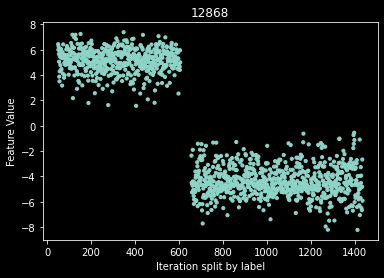

In [141]:
label1 = 1
label2 = 4
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '12868'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  leukemia


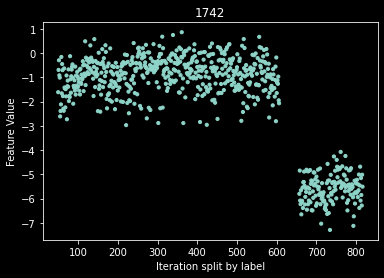

In [142]:
label1 = 1
label2 = 5
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '1742'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  liver


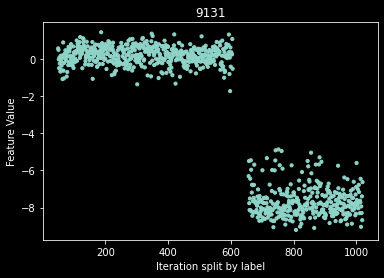

In [143]:
label1 = 1
label2 = 6
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9131'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  lung


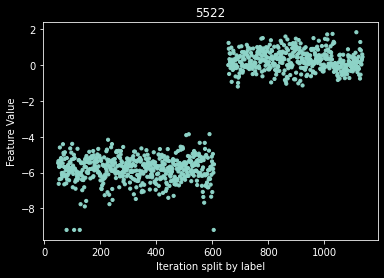

In [144]:
label1 = 1
label2 = 7
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '5522'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  melanoma
['4401', '12868', '11003', '13621', '8893', '1742']
[0, 0, 0, 0, 0, 0]


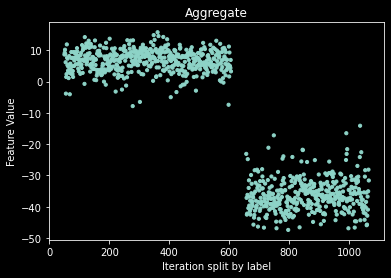

In [145]:
label1 = 1
label2 = 8
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['4401', '12868', '11003', '13621', '8893', '1742']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: brain  and  ovary


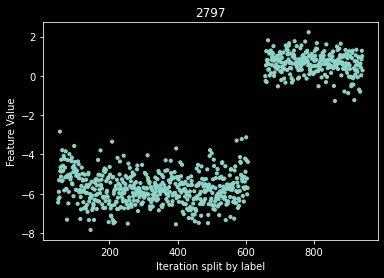

In [146]:
label1 = 1
label2 = 9
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2797'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  pancreas


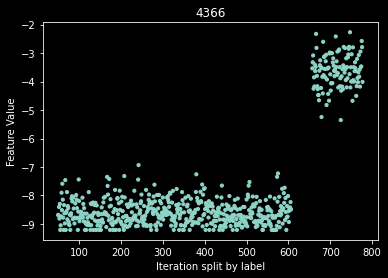

In [147]:
label1 = 1
label2 = 10
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '4366'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  prostate


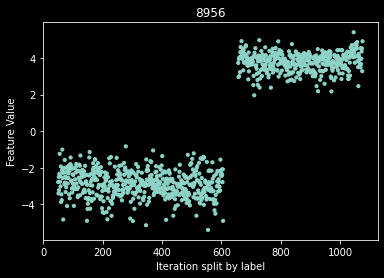

In [148]:
label1 = 1
label2 = 11
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8956'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  sarcoma
['12868', '2638', '2654', '6566', '4401', '8173']
[0, 0, 0, 0, 0, 0]


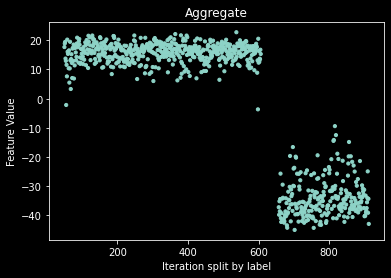

In [149]:
label1 = 1
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurenamelist = ['12868', '2638', '2654', '6566', '4401', '8173']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: brain  and  squamous
['12868', '9804', '1543', '4223', '9131', '5522']
[0, 1, 0, 1, 0, 1]


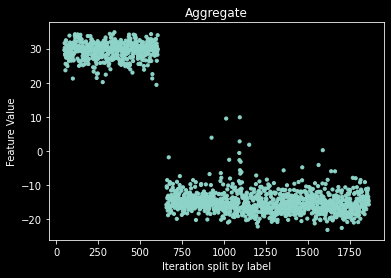

In [150]:
label1 = 1
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['12868', '9804', '1543', '4223', '9131', '5522']
reverse = [0, 1, 0, 1, 0, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: brain  and  stomach


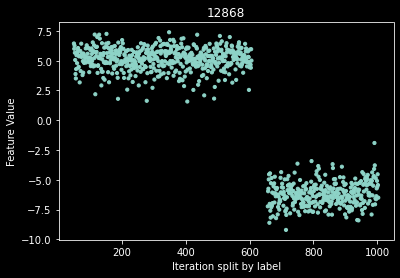

In [151]:
label1 = 1
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '12868'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  testes


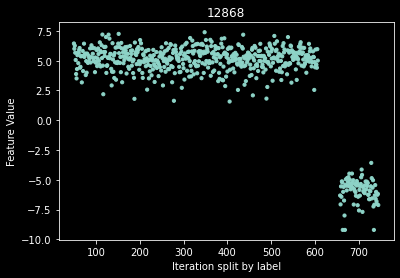

In [152]:
label1 = 1
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '12868'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  thymus


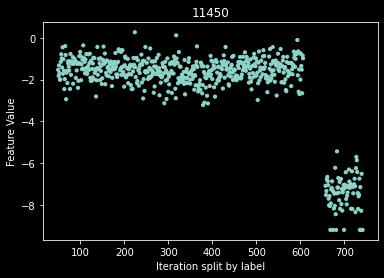

In [153]:
label1 = 1
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '11450'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  thyroid


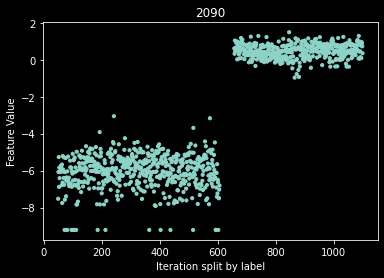

In [154]:
label1 = 1
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2090'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: brain  and  uterus
['9935', '1543', '5384', '1780', '12868', '10439']
[0, 0, 0, 0, 0, 0]


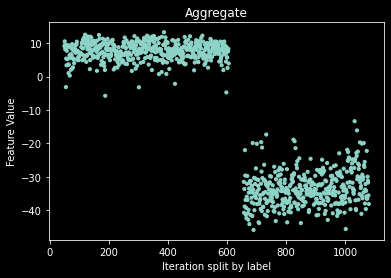

In [155]:
label1 = 1
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['9935', '1543', '5384', '1780', '12868', '10439']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: breast  and  colorectal


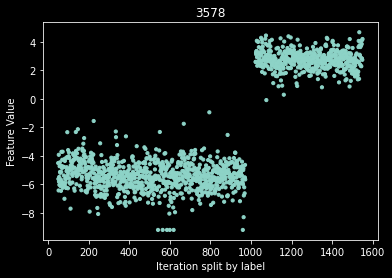

In [156]:
label1 = 2
label2 = 3
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '3578'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: breast  and  kidney
['268', '2215', '12071', '9272', '13328', '7758']
[0, 0, 0, 0, 1, 1]


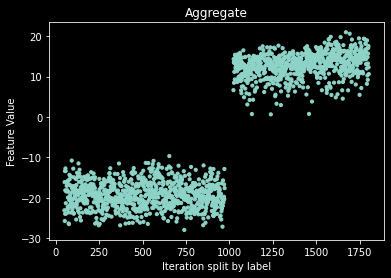

In [157]:
label1 = 2
label2 = 4
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['268', '2215', '12071', '9272', '13328', '7758']
reverse = [0, 0, 0, 0, 1, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: breast  and  leukemia


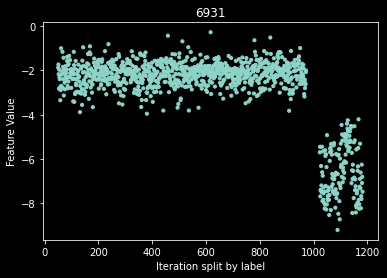

In [158]:
label1 = 2
label2 = 5
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '6931'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: breast  and  liver
['3800', '540', '11582', '9254', '8973', '2745']
[0, 0, 0, 0, 0, 0]


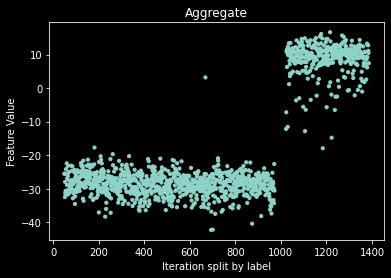

In [159]:
label1 = 2
label2 = 6
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['3800', '540', '11582', '9254', '8973', '2745']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: breast  and  lung
['11864', '13255', '8091', '2600', '2215', '10002']
[0, 0, 0, 0, 0, 0]


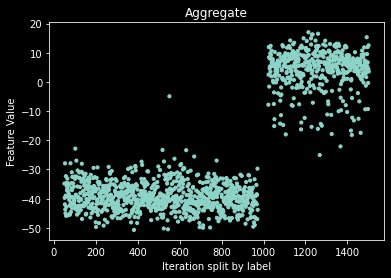

In [160]:
label1 = 2
label2 = 7
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['11864', '13255', '8091', '2600', '2215', '10002']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: breast  and  melanoma
['3387', '11347', '4366', '6735', '2604', '7134']
[0, 0, 0, 0, 0, 0]


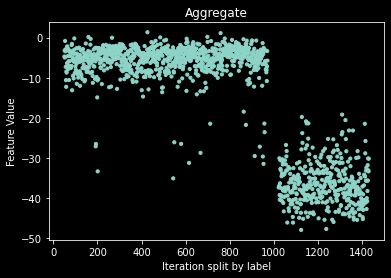

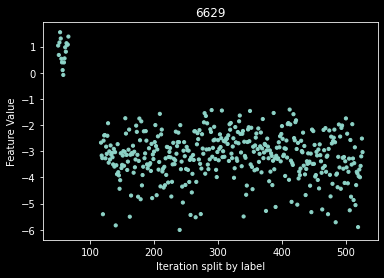

In [161]:
label1 = 2
label2 = 8
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['3387', '11347', '4366', '6735', '2604', '7134']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = Aggregate(i, featurenamelist, reverse)

    if v < -16:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#first feature
featurename = '6629'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: breast  and  ovary
['12160', '5547', '1226', '3161', '7213', '4848']
[0, 0, 0, 0, 0, 0]


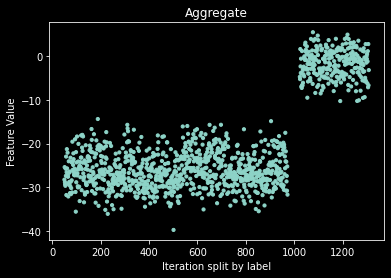

In [162]:
label1 = 2
label2 = 9
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['12160', '5547', '1226', '3161', '7213', '4848']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: breast  and  pancreas


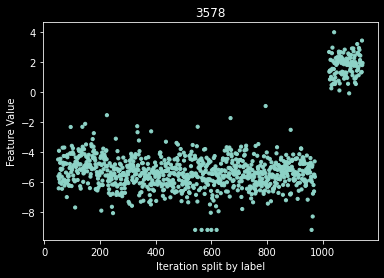

In [163]:
label1 = 2
label2 = 10
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '3578'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: breast  and  prostate
['11311', '4322', '200', '4505', '9384', '9547']
[0, 0, 0, 0, 0, 0]


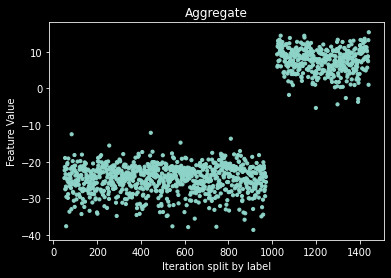

In [164]:
label1 = 2
label2 = 11
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['11311', '4322', '200', '4505', '9384', '9547']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: breast  and  sarcoma
['1656', '4366', '2090', '8720', '2929', '4239']
[0, 0, 0, 0, 0, 0]


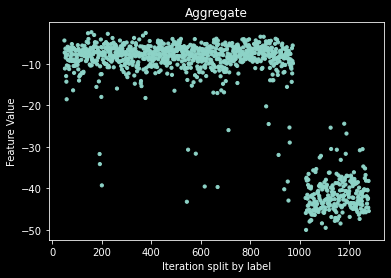

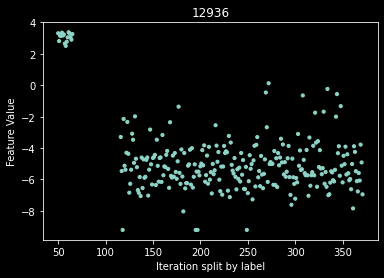

In [165]:
label1 = 2
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['1656', '4366', '2090', '8720', '2929', '4239']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = Aggregate(i, featurenamelist, reverse)

    if v < -21:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurename = '12936'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: breast  and  squamous
['7930', '1157', '3489', '6061', '13559', '9567']
[0, 0, 0, 0, 1, 0]


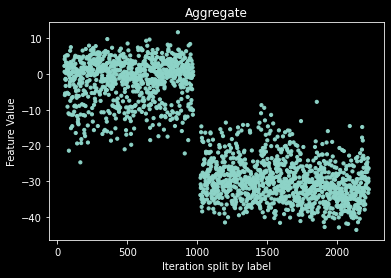

['9754', '5778', '212', '4848', '3363', '9530']
[0, 0, 0, 0, 0, 0]


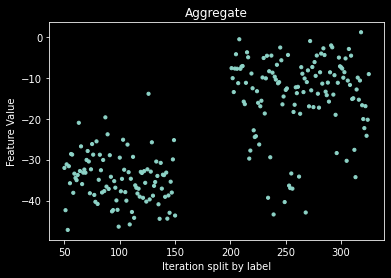

In [34]:
label1 = 2
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['7930', '1157', '3489', '6061', '13559', '9567']
reverse = [0, 0, 0, 0, 1, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = Aggregate(i, featurenamelist, reverse)

    if v < -10 and v > -23:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurenamelist = ['9754', '5778', '212', '4848', '3363', '9530']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: breast  and  stomach
['846', '3578', '13328', '7113', '2597', '10002']
[0, 0, 1, 0, 0, 0]


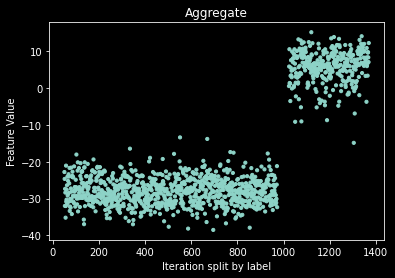

In [167]:
label1 = 2
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['846', '3578', '13328', '7113', '2597', '10002']
reverse = [0, 0, 1, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: breast  and  testes


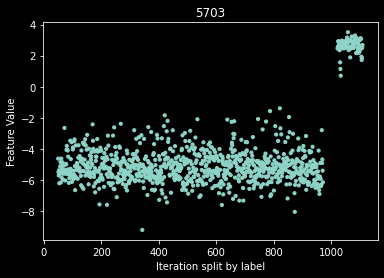

In [168]:
label1 = 2
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '5703'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: breast  and  thymus
['3873', '10631', '11177', '5271', '1646', '12257']
[0, 0, 0, 0, 0, 0]


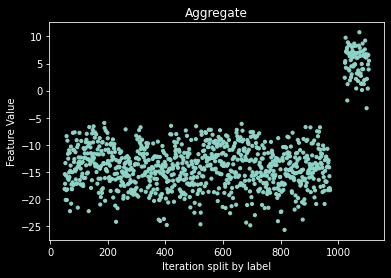

In [169]:
label1 = 2
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['3873', '10631', '11177', '5271', '1646', '12257']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: breast  and  thyroid


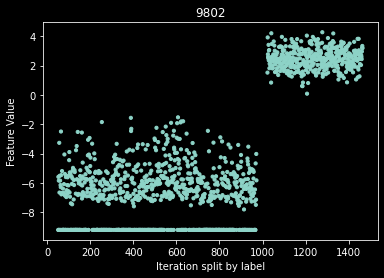

In [170]:
label1 = 2
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9802'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: breast  and  uterus
['8484', '13634', '9567', '2600', '12160', '12294']
[0, 0, 0, 1, 1, 0]


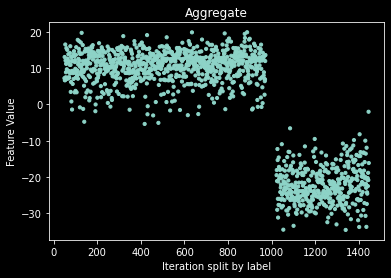

In [15]:
label1 = 2
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['8484', '13634', '9567', '2600', '12160', '12294']
reverse = [0, 0, 0, 1, 1, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: colorectal  and  kidney
['6438', '12489', '12766', '4011', '8721', '8943']
[0, 0, 0, 0, 0, 0]


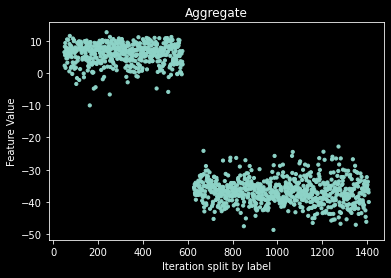

In [172]:
label1 = 3
label2 = 4
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['6438', '12489', '12766', '4011', '8721', '8943']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: colorectal  and  leukemia


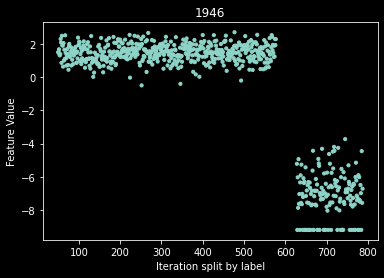

In [173]:
label1 = 3
label2 = 5
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '1946'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: colorectal  and  liver


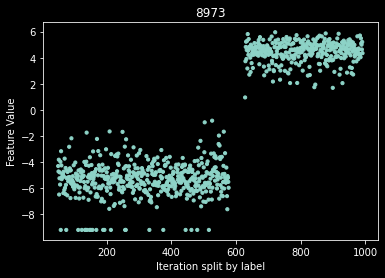

In [174]:
label1 = 3
label2 = 6
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8973'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: colorectal  and  lung


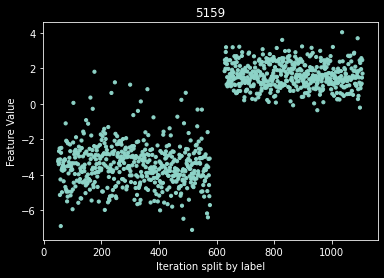

['7161', '8408', '11864', '6794', '13255', '8091']
[0, 0, 1, 0, 1, 1]


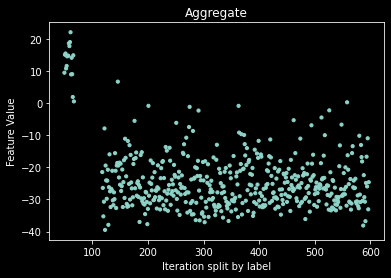

In [175]:
label1 = 3
label2 = 7
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '5159'
graphpairfeature(featurename, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]

    if v > -1:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurenamelist = ['7161', '8408', '11864', '6794', '13255', '8091']
reverse = [0, 0, 1, 0, 1, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: colorectal  and  melanoma


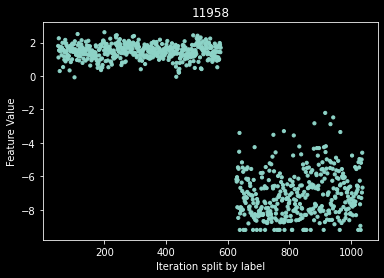

In [176]:
label1 = 3
label2 = 8
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '11958'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: colorectal  and  ovary


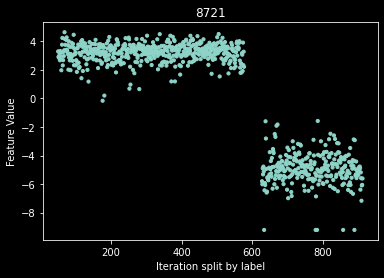

In [177]:
label1 = 3
label2 = 9
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8721'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: colorectal  and  pancreas
['5232', '2752', '5486', '6296', '179', '5159']
[0, 0, 0, 1, 1, 0]


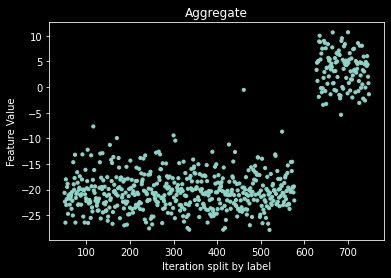

In [178]:
label1 = 3
label2 = 10
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['5232', '2752', '5486', '6296', '179', '5159']
reverse = [0, 0, 0, 1, 1, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: colorectal  and  prostate


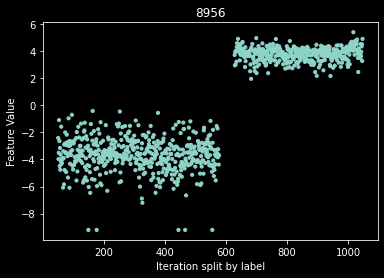

In [179]:
label1 = 3
label2 = 11
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8956'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: colorectal  and  sarcoma


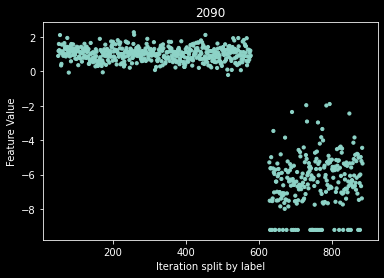

In [180]:
label1 = 3
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2090'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: colorectal  and  squamous


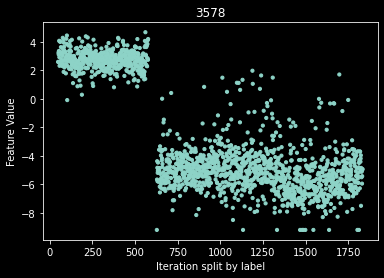

['274', '5486', '4359', '5201', '8078', '13477']
[0, 0, 0, 0, 0, 0]


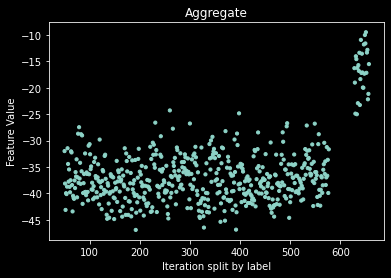

In [181]:
label1 = 3
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '3578'
graphpairfeature(featurename, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]

    if v > -1:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurenamelist = ['274', '5486', '4359', '5201', '8078', '13477']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: colorectal  and  stomach


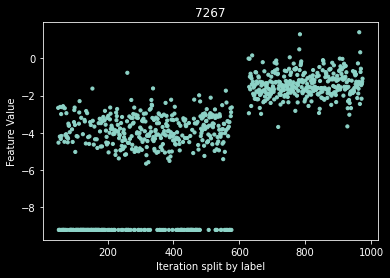

['7267', '4419', '12704', '13336', '13519', '3745']
[0, 0, 0, 1, 1, 1]


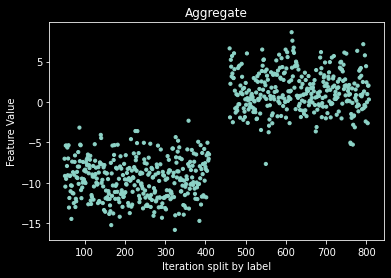

['1106', '13470', '12489', '9592', '10376', '9908']
[0, 0, 0, 0, 0, 1]


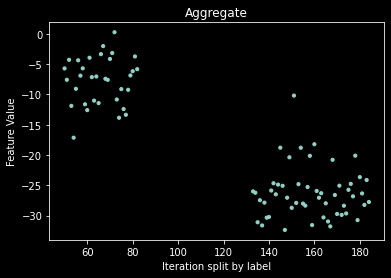

In [182]:
label1 = 3
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '7267'
graphpairfeature(featurename, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]

    if v > -8:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurenamelist = ['7267', '4419', '12704', '13336', '13519', '3745']
reverse = [0, 0, 0, 1, 1, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = Aggregate(i, featurenamelist, reverse)

    if v < -1 and v > -6:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurenamelist = ['1106', '13470', '12489', '9592', '10376', '9908']
reverse = [0, 0, 0, 0, 0, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: colorectal  and  testes


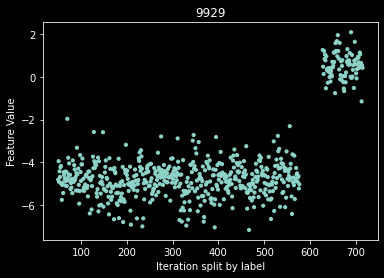

In [183]:
label1 = 3
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9929'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: colorectal  and  thymus


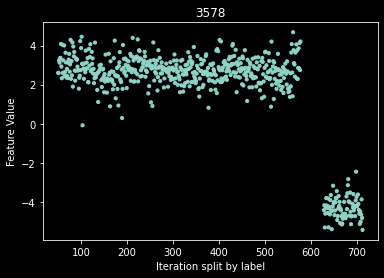

In [184]:
label1 = 3
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '3578'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: colorectal  and  thyroid


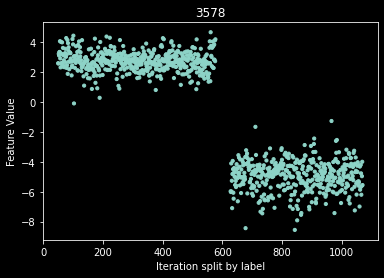

In [185]:
label1 = 3
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '3578'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: colorectal  and  uterus


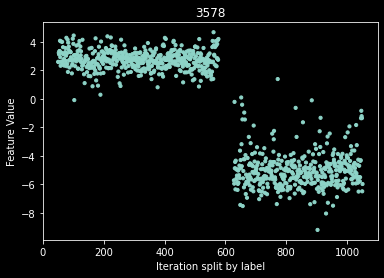

In [186]:
label1 = 3
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '3578'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: kidney  and  leukemia
['8543', '9792', '5891', '3066', '8177', '12071']
[0, 0, 0, 0, 0, 0]


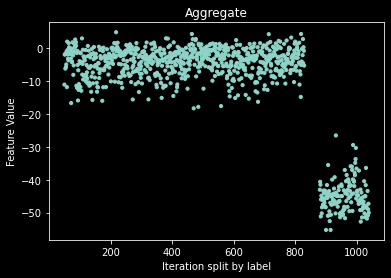

In [187]:
label1 = 4
label2 = 5
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['8543', '9792', '5891', '3066', '8177', '12071']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: kidney  and  liver
['12071', '5547', '1864', '8973', '801', '4847']
[0, 0, 1, 1, 1, 1]


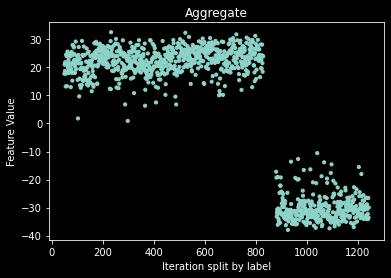

In [188]:
label1 = 4
label2 = 6
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['12071', '5547', '1864', '8973', '801', '4847']
reverse = [0, 0, 1, 1, 1, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: kidney  and  lung
['5999', '6438', '2821', '13397', '13237', '12071']
[0, 0, 0, 0, 0, 1]


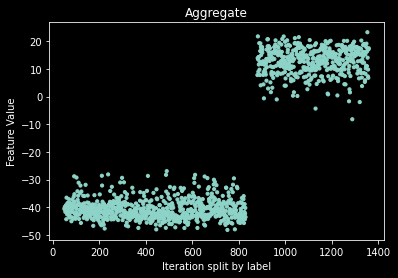

In [8]:
label1 = 4
label2 = 7
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['5999', '6438', '2821', '13397', '13237', '12071']
reverse = [0, 0, 0, 0, 0, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: kidney  and  melanoma
['2874', '11658', '8543', '960', '6598', '2604']
[0, 0, 0, 0, 0, 0]


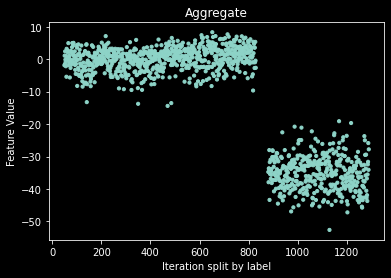

In [9]:
label1 = 4
label2 = 8
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['2874', '11658', '8543', '960', '6598', '2604']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: kidney  and  ovary
['1564', '3881', '6712', '8444', '3093', '5759']
[0, 0, 0, 0, 0, 0]


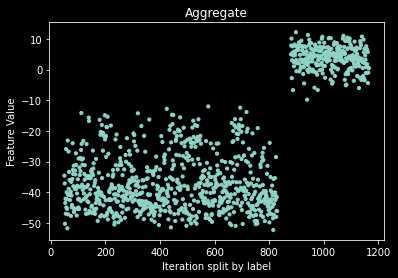

In [10]:
label1 = 4
label2 = 9
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['1564', '3881', '6712', '8444', '3093', '5759']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: kidney  and  pancreas
['6438', '13076', '13237', '5999', '2821', '12071']
[0, 0, 0, 0, 0, 1]


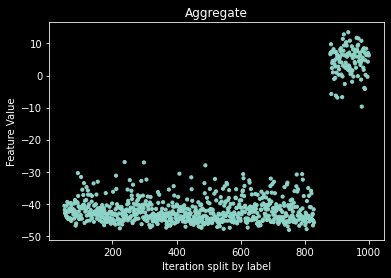

In [11]:
label1 = 4
label2 = 10
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['6438', '13076', '13237', '5999', '2821', '12071']
reverse = [0, 0, 0, 0, 0, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: kidney  and  prostate


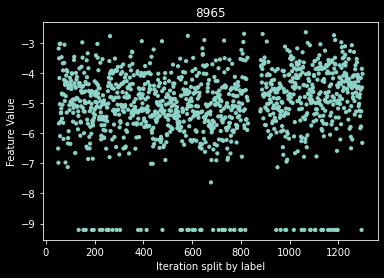

In [12]:
label1 = 4
label2 = 11
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8965'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: kidney  and  sarcoma
['268', '11658', '4979', '8177', '2797', '8543']
[0, 0, 0, 0, 0, 0]


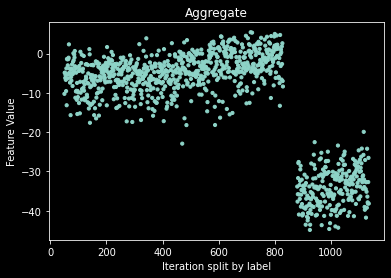

In [13]:
label1 = 4
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['268', '11658', '4979', '8177', '2797', '8543']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: kidney  and  squamous


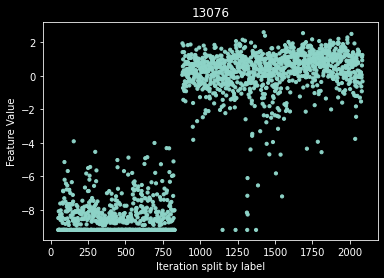

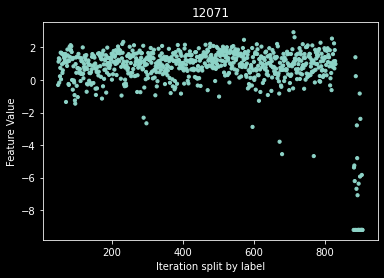

In [14]:
label1 = 4
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '13076'
graphpairfeature(featurename, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]

    if v < -3:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurename = '12071'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: kidney  and  stomach
i =  1000
i =  2000
i =  3000
i =  4000
i =  5000
i =  6000
i =  7000
i =  8000
i =  9000
i =  10000
i =  11000
i =  12000
i =  13000
Starting to print graphs
Top feature  12071  index  0
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


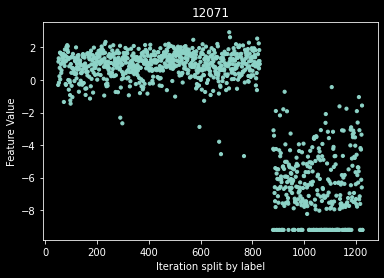

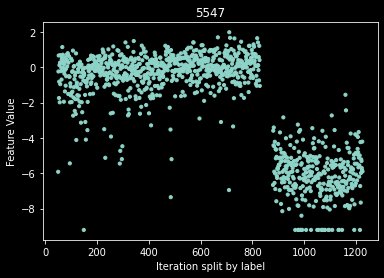

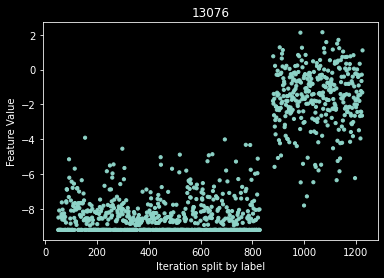

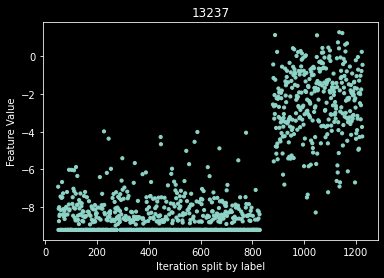

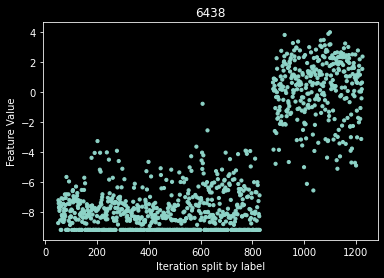

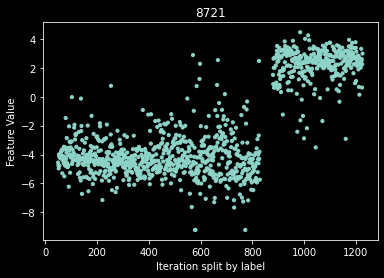

['12071', '5547', '13076', '13237', '6438', '8721']
[0, 0, 1, 1, 1, 1]


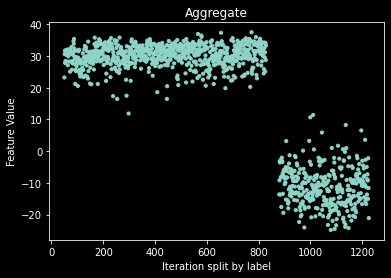

Top feature  8943  index  1
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


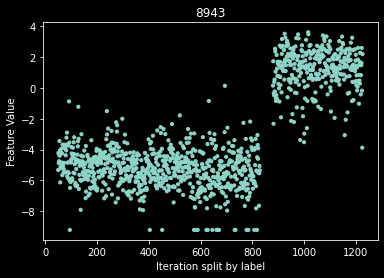

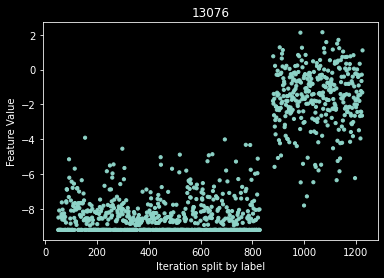

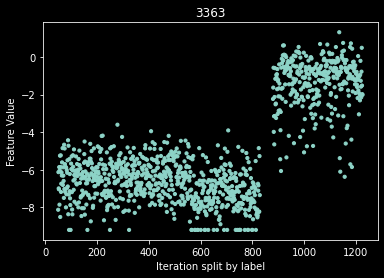

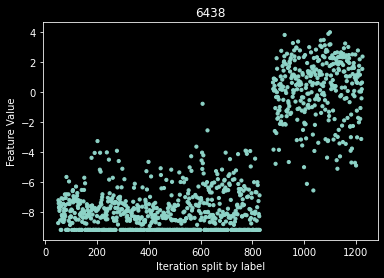

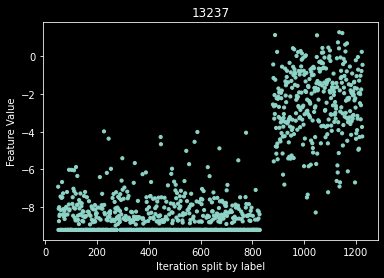

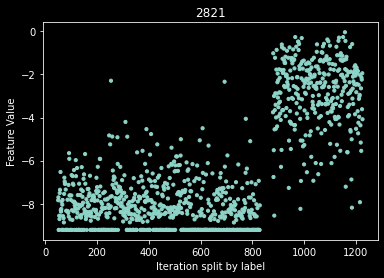

['8943', '13076', '3363', '6438', '13237', '2821']
[0, 0, 0, 0, 0, 0]


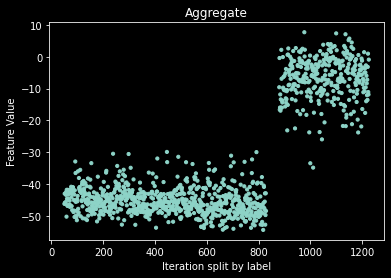

Top feature  6438  index  2
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


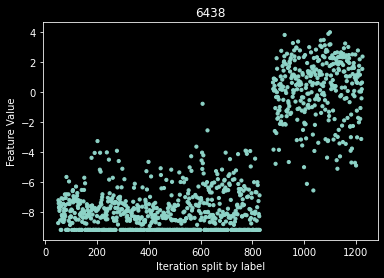

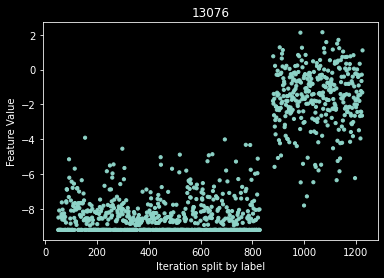

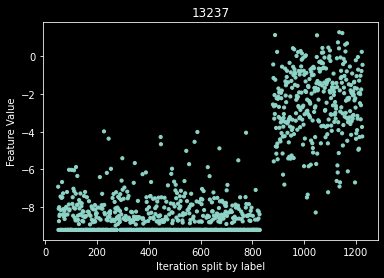

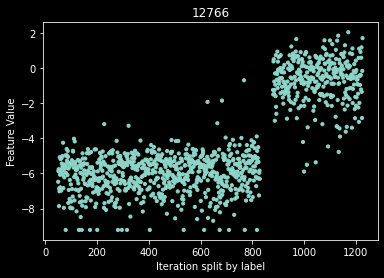

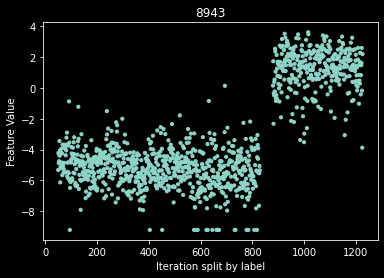

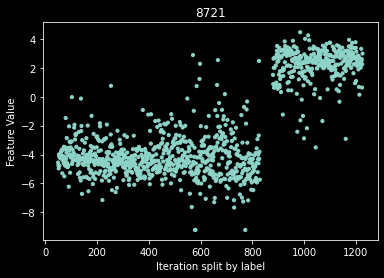

['6438', '13076', '13237', '12766', '8943', '8721']
[0, 0, 0, 0, 0, 0]


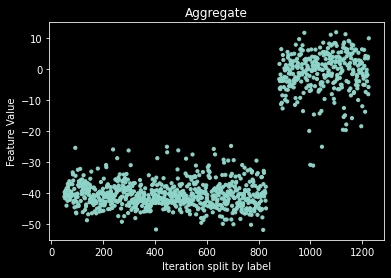

Top feature  13076  index  3
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


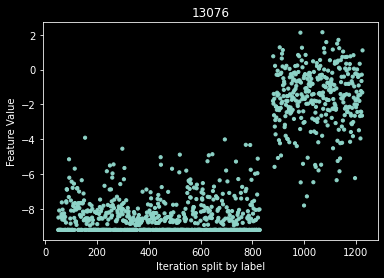

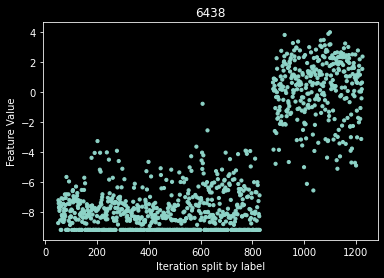

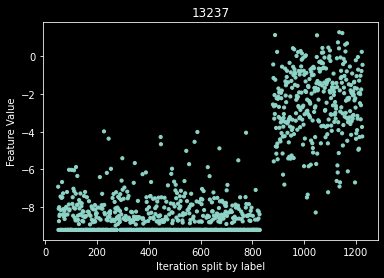

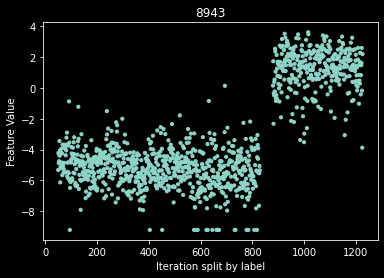

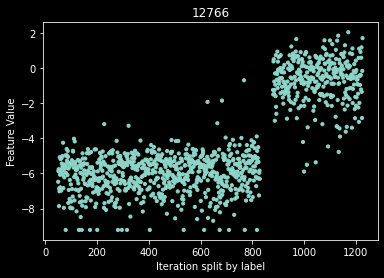

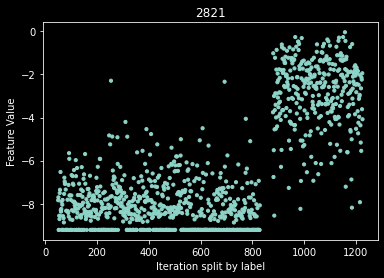

['13076', '6438', '13237', '8943', '12766', '2821']
[0, 0, 0, 0, 0, 0]


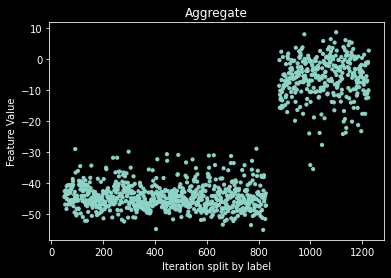

Top feature  12766  index  4
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


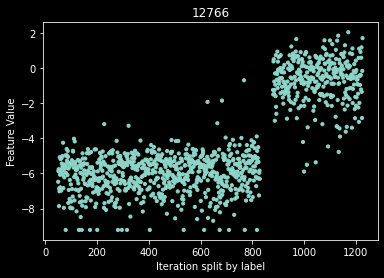

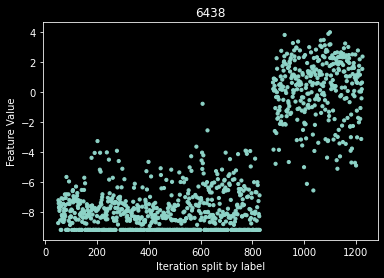

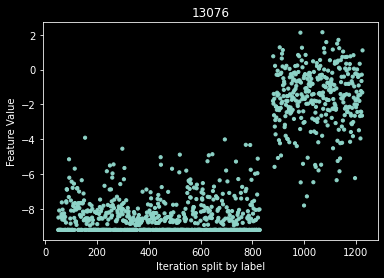

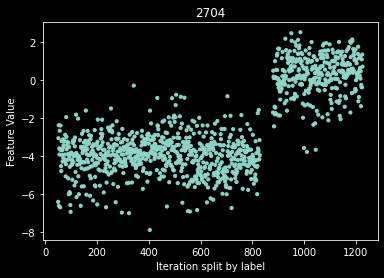

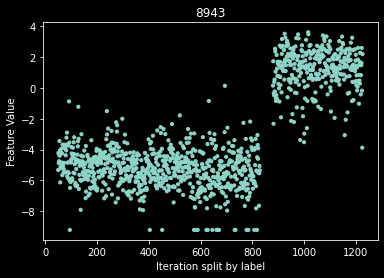

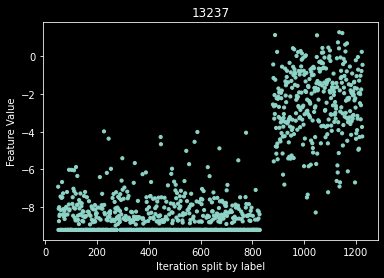

['12766', '6438', '13076', '2704', '8943', '13237']
[0, 0, 0, 0, 0, 0]


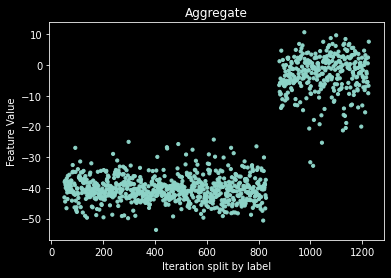

['12071', '5547', '13076', '13237', '6438', '8721']
[0, 0, 1, 1, 1, 1]


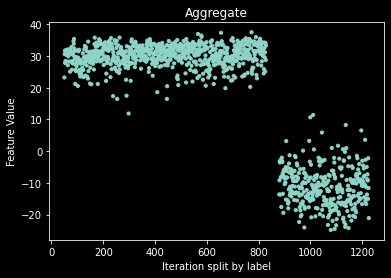

In [17]:
label1 = 4
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

plottop5features(label1, label2, indexlist)
#new value
featurenamelist = ['12071', '5547', '13076', '13237', '6438', '8721']
reverse = [0, 0, 1, 1, 1, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: kidney  and  testes


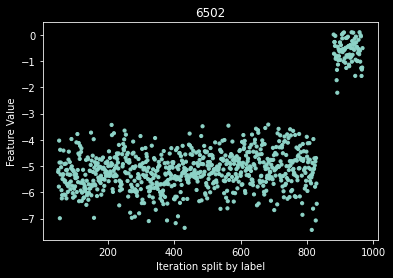

In [297]:
label1 = 4
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '6502'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: kidney  and  thymus


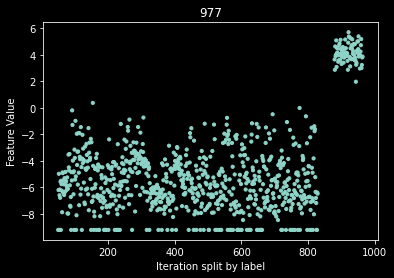

In [298]:
label1 = 4
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '977'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: kidney  and  thyroid
['9802', '12925', '6367', '10391', '9856', '12071']
[0, 0, 0, 0, 0, 1]


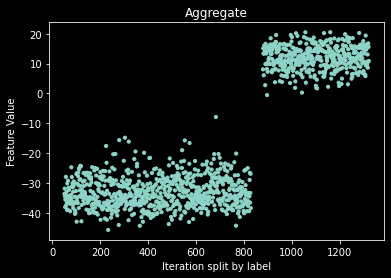

In [299]:
label1 = 4
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['9802', '12925', '6367', '10391', '9856', '12071']
reverse = [0, 0, 0, 0, 0, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: kidney  and  uterus
['7758', '10683', '3363', '6712', '12160', '13199']
[0, 0, 0, 0, 0, 0]


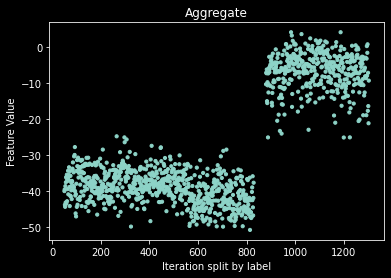

In [300]:
label1 = 4
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['7758', '10683', '3363', '6712', '12160', '13199']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: leukemia  and  liver


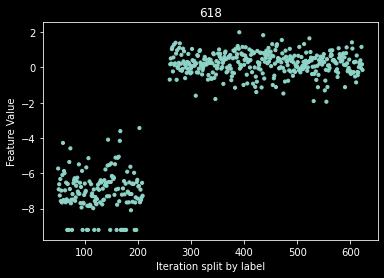

In [301]:
label1 = 5
label2 = 6
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '618'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: leukemia  and  lung


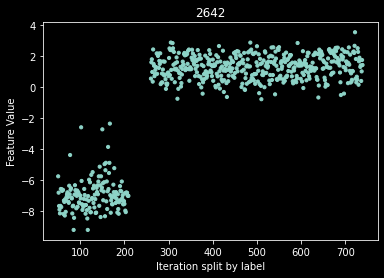

In [302]:
label1 = 5
label2 = 7
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2642'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: leukemia  and  melanoma
['93', '7460', '5651', '12801', '2661', '12127']
[0, 0, 0, 0, 0, 0]


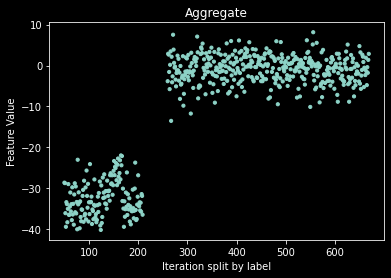

In [303]:
label1 = 5
label2 = 8
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['93', '7460', '5651', '12801', '2661', '12127']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: leukemia  and  ovary


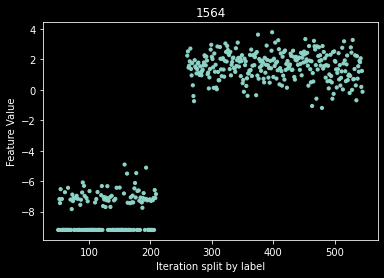

In [304]:
label1 = 5
label2 = 9
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '1564'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: leukemia  and  pancreas


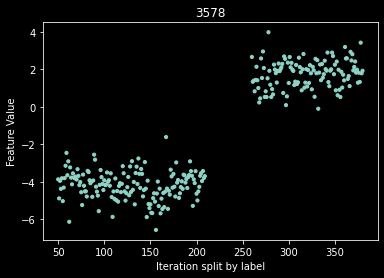

In [305]:
label1 = 5
label2 = 10
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '3578'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: leukemia  and  prostate


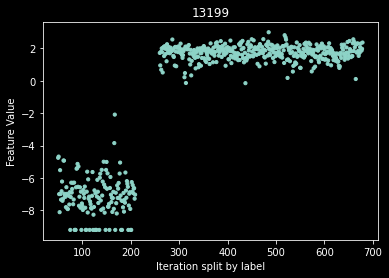

In [306]:
label1 = 5
label2 = 11
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '13199'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: leukemia  and  sarcoma


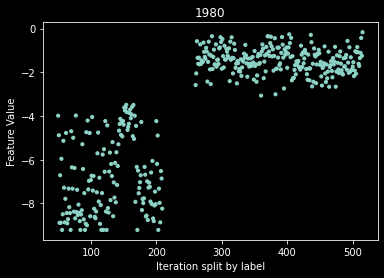

In [307]:
label1 = 5
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '1980'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: leukemia  and  squamous
['4734', '3983', '187', '5487', '4151', '1991']
[0, 0, 0, 0, 0, 0]


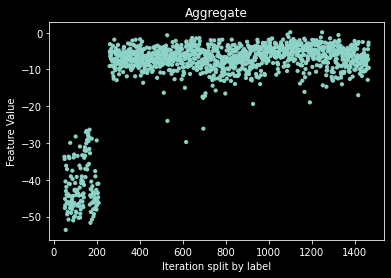

In [308]:
label1 = 5
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['4734', '3983', '187', '5487', '4151', '1991']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: leukemia  and  stomach


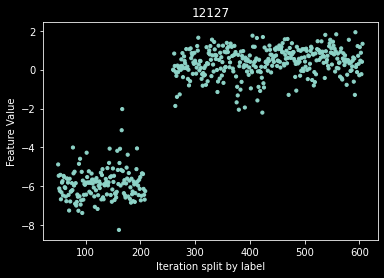

In [309]:
label1 = 5
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '12127'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: leukemia  and  testes


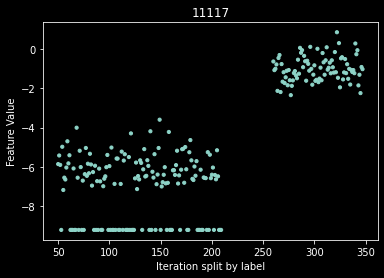

In [310]:
label1 = 5
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '11117'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: leukemia  and  thymus


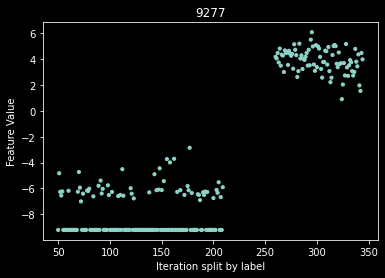

In [311]:
label1 = 5
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9277'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: leukemia  and  thyroid


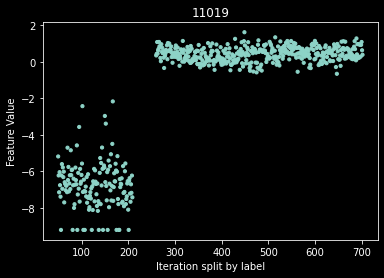

In [312]:
label1 = 5
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '11019'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: leukemia  and  uterus


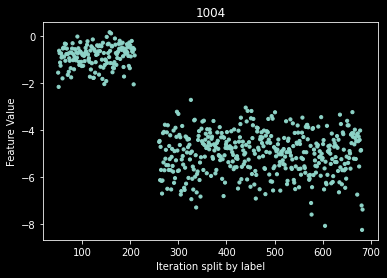

In [313]:
label1 = 5
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '1004'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: liver  and  lung
['1864', '8973', '540', '2821', '13255', '13539']
[0, 0, 0, 1, 1, 0]


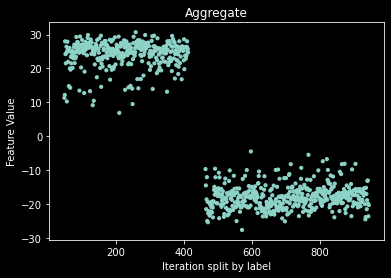

In [314]:
label1 = 6
label2 = 7
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['1864', '8973', '540', '2821', '13255', '13539']
reverse = [0, 0, 0, 1, 1, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: liver  and  melanoma


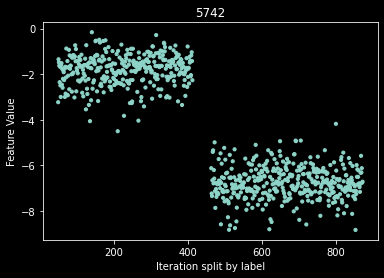

In [315]:
label1 = 6
label2 = 8
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '5742'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: liver  and  ovary


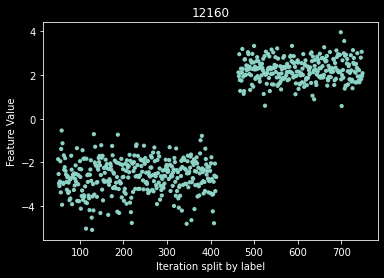

In [316]:
label1 = 6
label2 = 9
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '12160'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: liver  and  pancreas
['3363', '6597', '10741', '2245', '2821', '5495']
[0, 0, 0, 0, 0, 0]


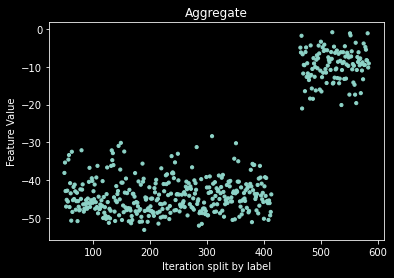

In [317]:
label1 = 6
label2 = 10
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['3363', '6597', '10741', '2245', '2821', '5495']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: liver  and  prostate


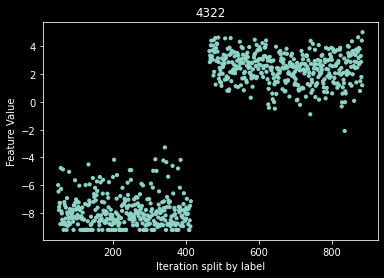

In [318]:
label1 = 6
label2 = 11
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '4322'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: liver  and  sarcoma


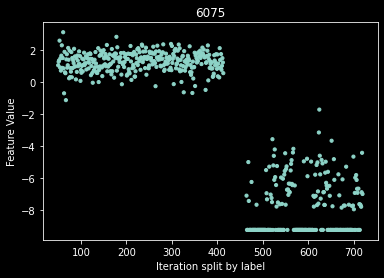

In [319]:
label1 = 6
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '6075'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: liver  and  squamous
['3800', '11582', '8973', '540', '2745', '4584']
[0, 0, 0, 0, 0, 0]


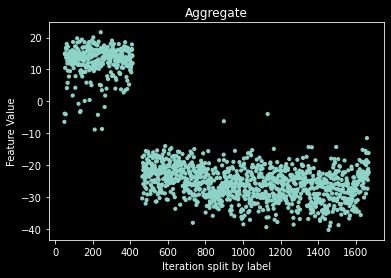

In [320]:
label1 = 6
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['3800', '11582', '8973', '540', '2745', '4584']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: liver  and  stomach
i =  1000
i =  2000
i =  3000
i =  4000
i =  5000
i =  6000
i =  7000
i =  8000
i =  9000
i =  10000
i =  11000
i =  12000
i =  13000
Starting to print graphs
Top feature  8973  index  0
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


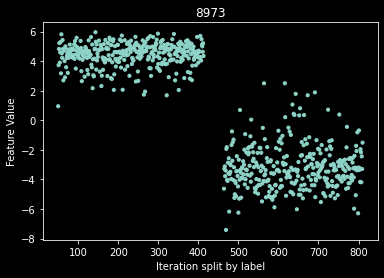

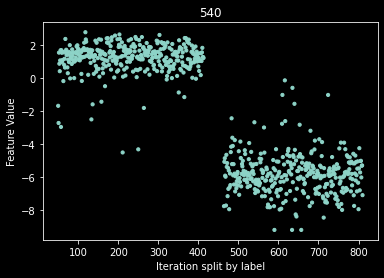

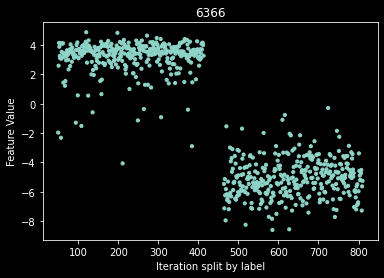

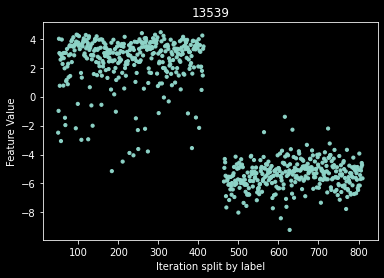

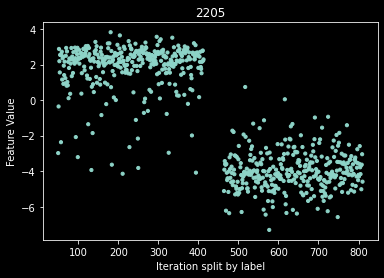

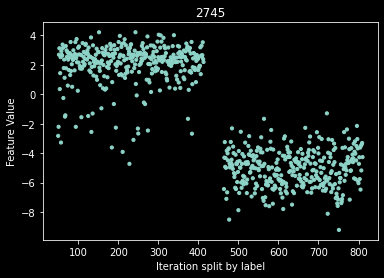

['8973', '540', '6366', '13539', '2205', '2745']
[0, 0, 0, 0, 0, 0]


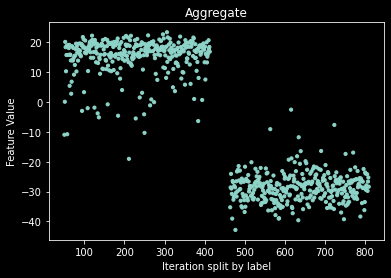

Top feature  6366  index  1
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


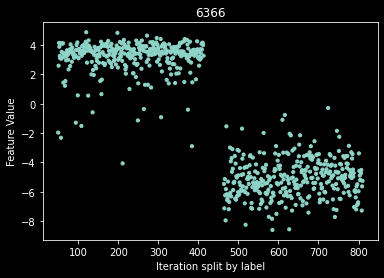

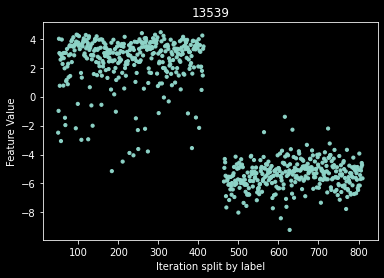

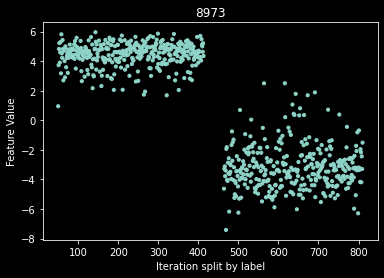

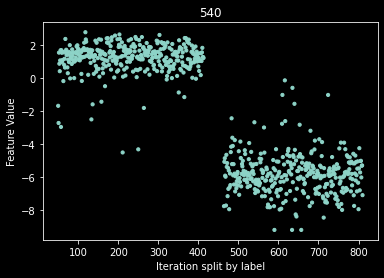

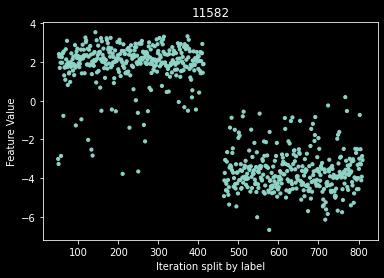

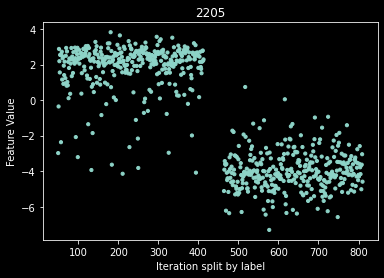

['6366', '13539', '8973', '540', '11582', '2205']
[0, 0, 0, 0, 0, 0]


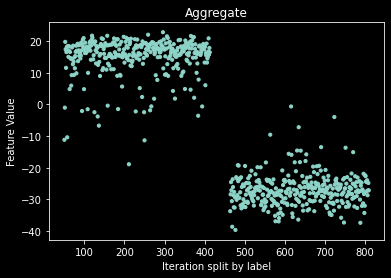

Top feature  540  index  2
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


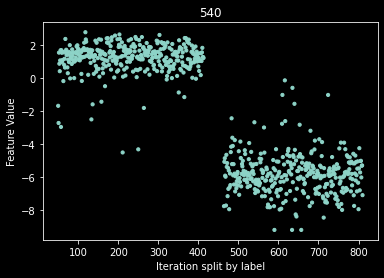

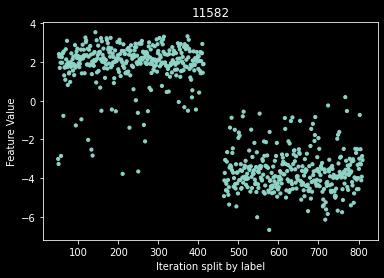

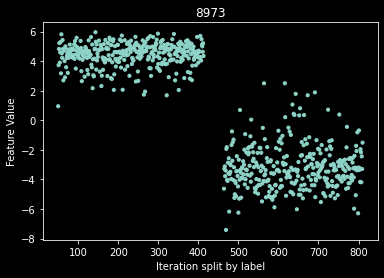

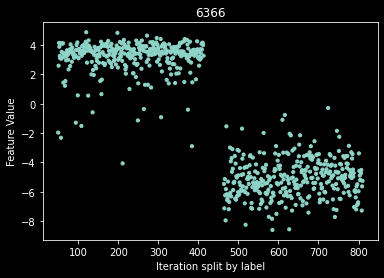

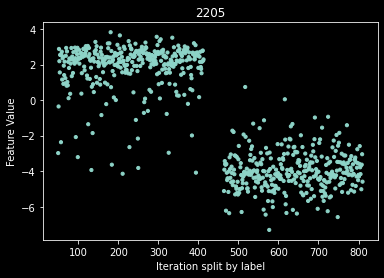

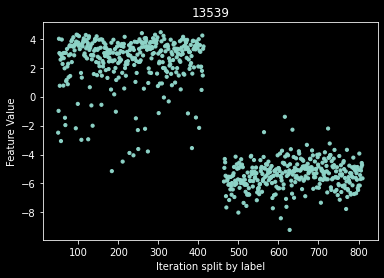

['540', '11582', '8973', '6366', '2205', '13539']
[0, 0, 0, 0, 0, 0]


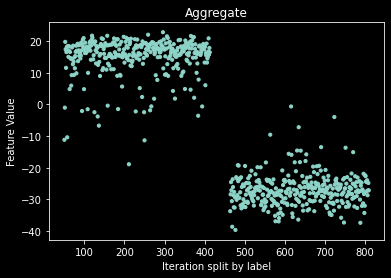

Top feature  4218  index  3
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


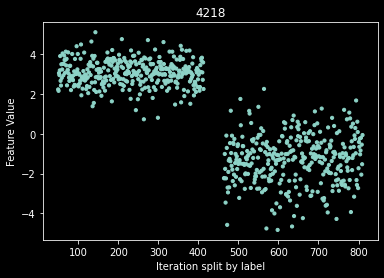

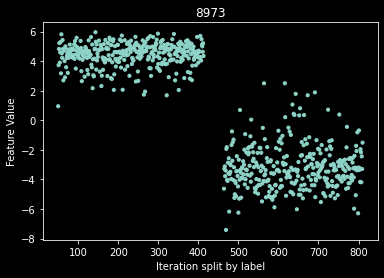

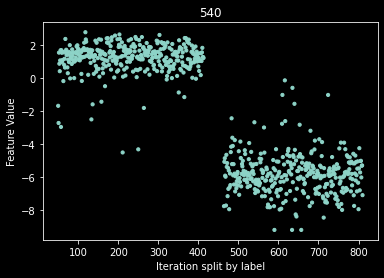

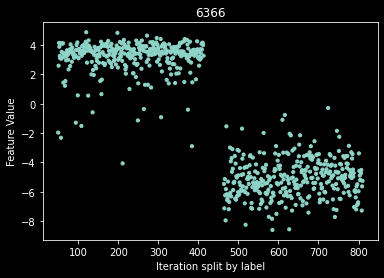

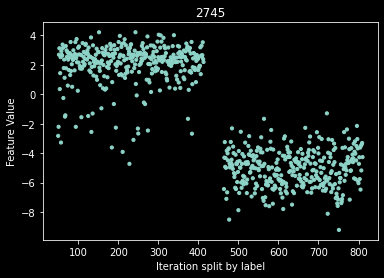

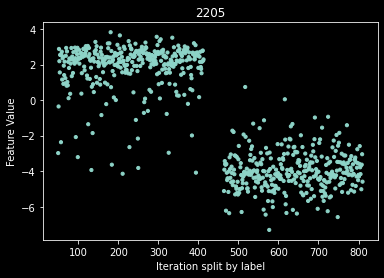

['4218', '8973', '540', '6366', '2745', '2205']
[0, 0, 0, 0, 0, 0]


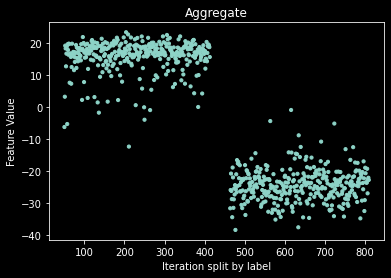

Top feature  4102  index  4
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


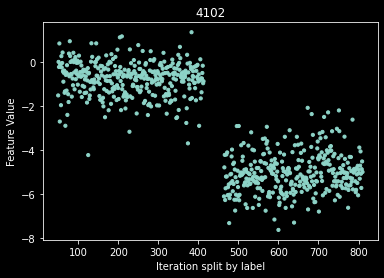

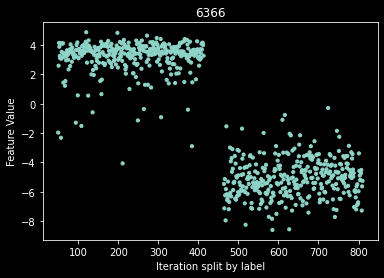

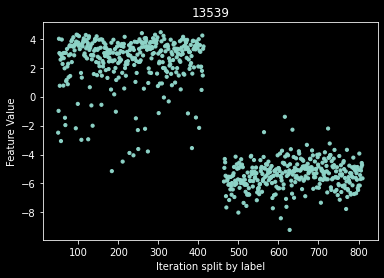

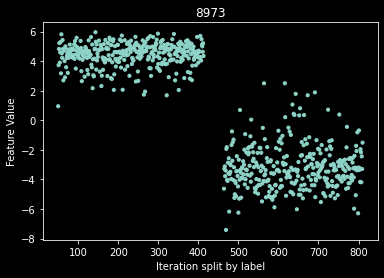

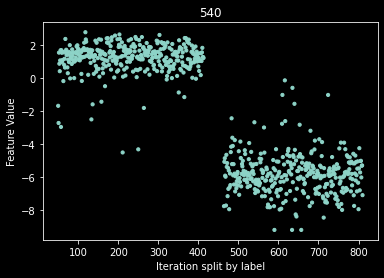

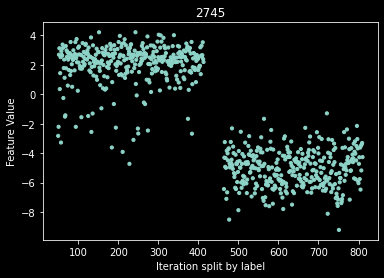

['4102', '6366', '13539', '8973', '540', '2745']
[0, 0, 0, 0, 0, 0]


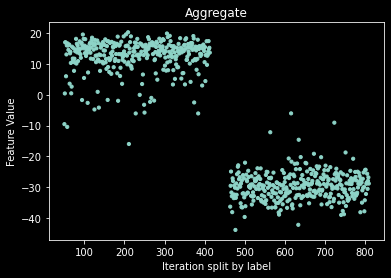

In [224]:
label1 = 6
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

plottop5features(label1, label2, indexlist)

#first feature
featurename = '5703'
#graphpairfeature(featurename, label1, label2, indexlist)

#new value
featurenamelist = ['6431', '2975', '10602', '5681', '3463', '5503']
reverse = [0, 0, 0, 0, 0, 0]
#graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: liver  and  testes


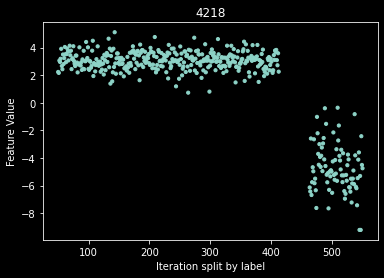

In [321]:
label1 = 6
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '4218'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: liver  and  thymus


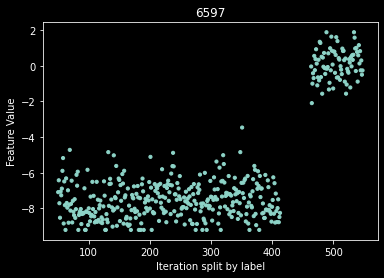

In [322]:
label1 = 6
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '6597'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: liver  and  thyroid


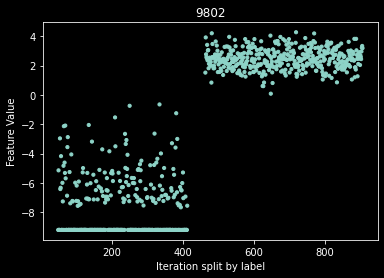

In [323]:
label1 = 6
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9802'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: liver  and  uterus


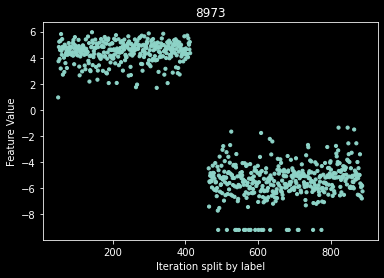

In [324]:
label1 = 6
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8973'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: lung  and  melanoma


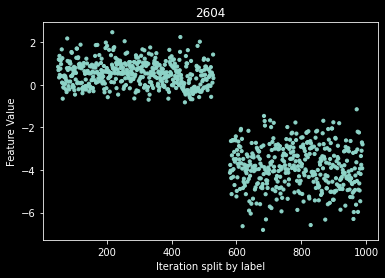

In [325]:
label1 = 7
label2 = 8
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2604'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: lung  and  ovary
['12160', '5547', '3161', '28', '13028', '443']
[0, 0, 0, 0, 0, 0]


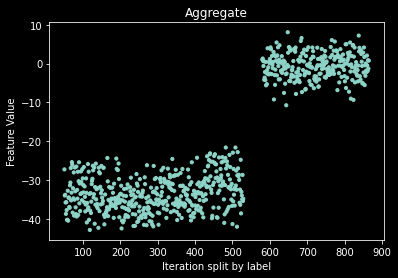

In [326]:
label1 = 7
label2 = 9
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['12160', '5547', '3161', '28', '13028', '443']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: lung  and  pancreas
['7758', '8091', '1497', '13255', '11864', '10602']
[0, 1, 0, 1, 1, 0]


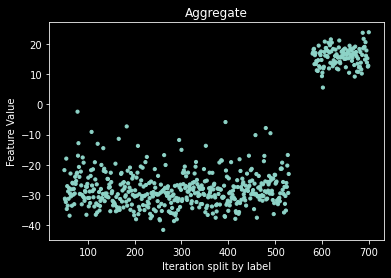

In [327]:
label1 = 7
label2 = 10
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['7758', '8091', '1497', '13255', '11864', '10602']
reverse = [0, 1, 0, 1, 1, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: lung  and  prostate


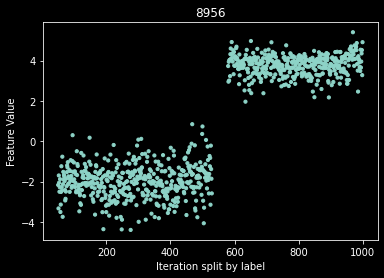

In [328]:
label1 = 7
label2 = 11
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8956'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: lung  and  sarcoma


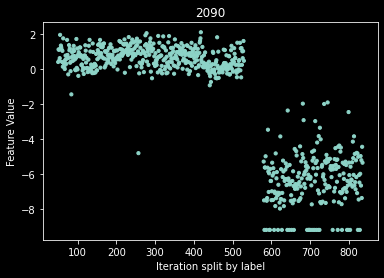

In [329]:
label1 = 7
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2090'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: lung  and  squamous


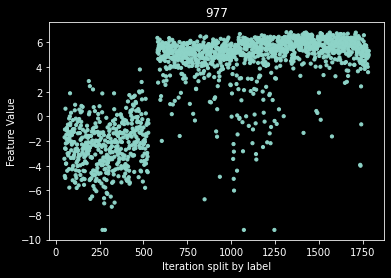

['13255', '8091', '11864', '240', '13397', '13088']
[0, 0, 0, 0, 0, 0]


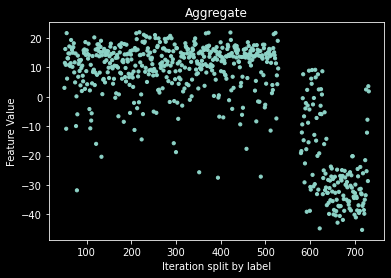

['11532', '977', '8078', '5718', '1200', '5076']
[0, 0, 0, 0, 0, 0]


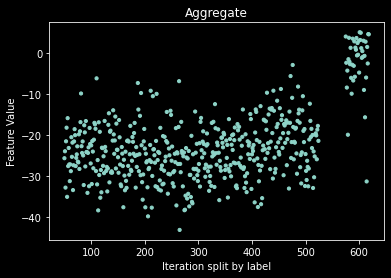

In [332]:
label1 = 7
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '977'
graphpairfeature(featurename, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]

    if v < 4:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist


featurenamelist = ['13255', '8091', '11864', '240', '13397', '13088']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = Aggregate(i, featurenamelist, reverse)

    if v > -20:
        
        tmpindexlist.append(i)
indexlist = tmpindexlist

featurenamelist = ['11532', '977', '8078', '5718', '1200', '5076']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: lung  and  stomach
['4440', '13255', '8091', '13397', '1732', '7721']
[0, 0, 0, 0, 0, 0]


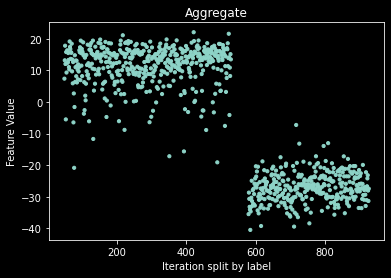

In [333]:
label1 = 7
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['4440', '13255', '8091', '13397', '1732', '7721']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: lung  and  testes


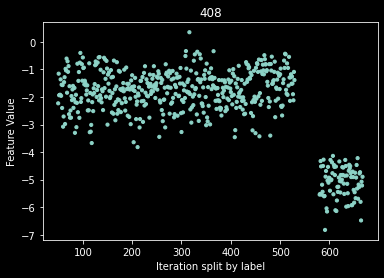

In [335]:
label1 = 7
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '408'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: lung  and  thymus
['11760', '966', '2797', '12122', '13082', '9408']
[0, 0, 0, 0, 0, 0]


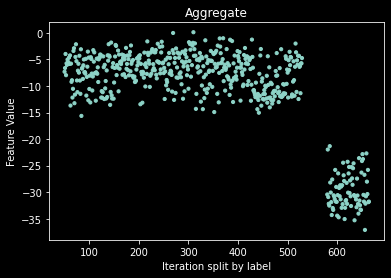

In [336]:
label1 = 7
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['11760', '966', '2797', '12122', '13082', '9408']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: lung  and  thyroid


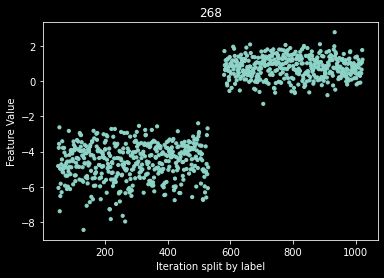

In [337]:
label1 = 7
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '268'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: lung  and  uterus
['268', '2118', '5547', '12160', '8091', '5443']
[0, 1, 0, 0, 1, 1]


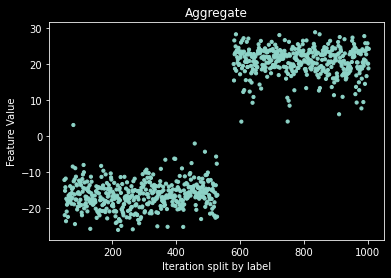

In [338]:
label1 = 7
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['268', '2118', '5547', '12160', '8091', '5443']
reverse = [0, 1, 0, 0, 1, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: melanoma  and  ovary


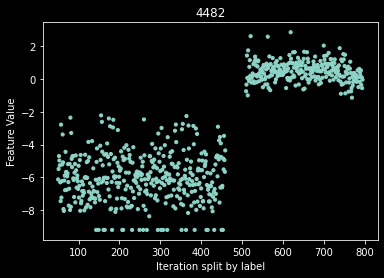

In [339]:
label1 = 8
label2 = 9
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '4482'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: melanoma  and  pancreas


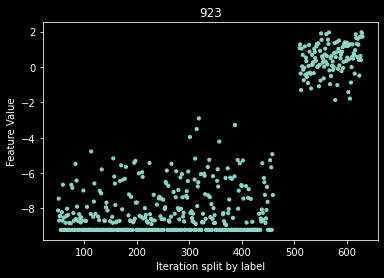

In [340]:
label1 = 8
label2 = 10
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '923'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: melanoma  and  prostate


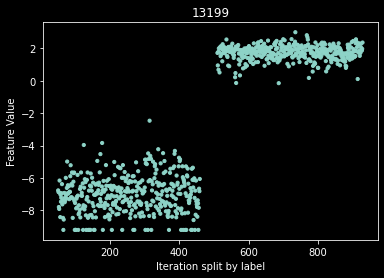

In [341]:
label1 = 8
label2 = 11
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '13199'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: melanoma  and  sarcoma
['6118', '12127', '2137', '5651', '9822', '3254']
[0, 0, 0, 0, 0, 0]


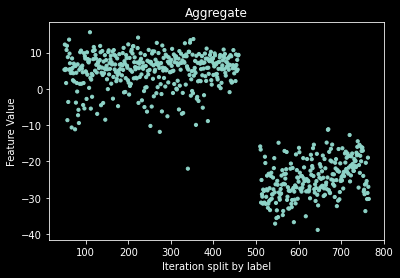

In [342]:
label1 = 8
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['6118', '12127', '2137', '5651', '9822', '3254']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: melanoma  and  squamous


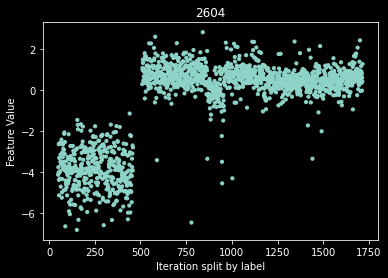

In [343]:
label1 = 8
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2604'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: melanoma  and  stomach


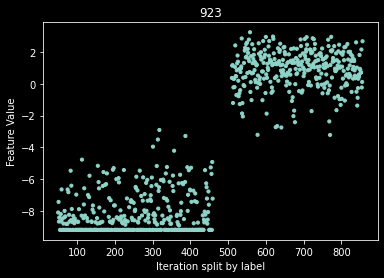

In [344]:
label1 = 8
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '923'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: melanoma  and  testes


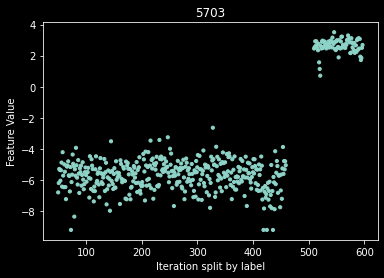

In [345]:
label1 = 8
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '5703'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: melanoma  and  thymus


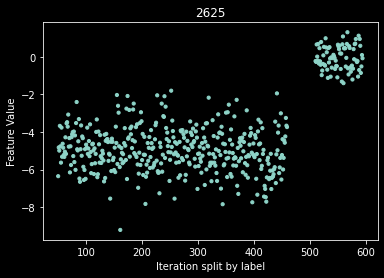

In [346]:
label1 = 8
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2625'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: melanoma  and  thyroid


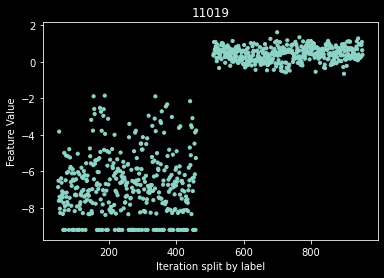

In [347]:
label1 = 8
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '11019'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: melanoma  and  uterus
['11928', '12160', '8510', '4366', '12662', '11958']
[0, 0, 0, 0, 0, 0]


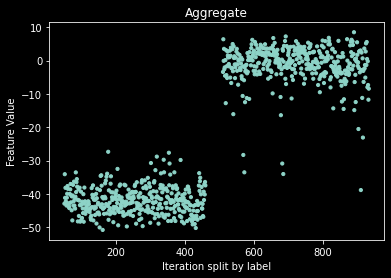

In [348]:
label1 = 8
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['11928', '12160', '8510', '4366', '12662', '11958']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: ovary  and  pancreas


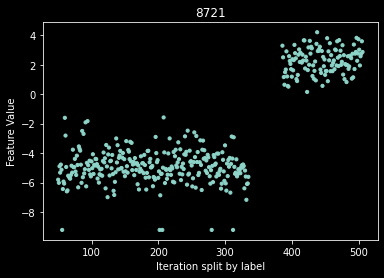

In [349]:
label1 = 9
label2 = 10
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8721'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: ovary  and  prostate


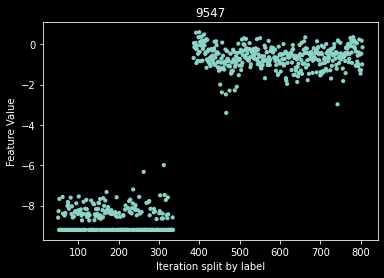

In [350]:
label1 = 9
label2 = 11
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9547'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: ovary  and  sarcoma


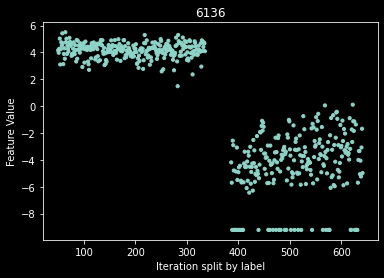

In [351]:
label1 = 9
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '6136'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: ovary  and  squamous


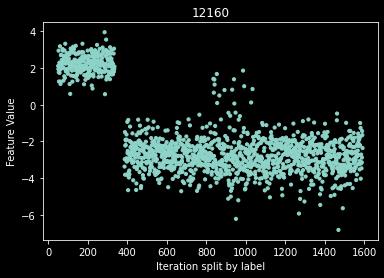

['5335', '9592', '7494', '5093', '11932', '1226']
[0, 0, 0, 0, 0, 0]


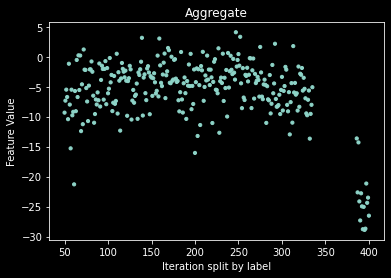

In [353]:
label1 = 9
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '12160'
graphpairfeature(featurename, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]

    if v > 0:

        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurenamelist = ['5335', '9592', '7494', '5093', '11932', '1226']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)


Labels being compared: ovary  and  stomach
['12160', '5547', '1226', '5335', '443', '8721']
[0, 0, 0, 0, 0, 1]


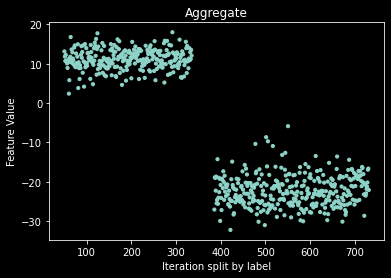

In [354]:
label1 = 9
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['12160', '5547', '1226', '5335', '443', '8721']
reverse = [0, 0, 0, 0, 0, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: ovary  and  testes


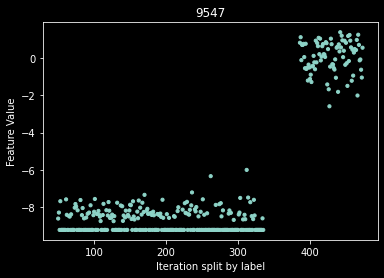

In [355]:
label1 = 9
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9547'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: ovary  and  thymus


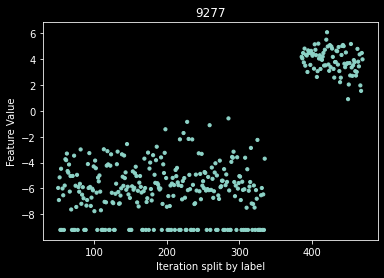

In [356]:
label1 = 9
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9277'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: ovary  and  thyroid


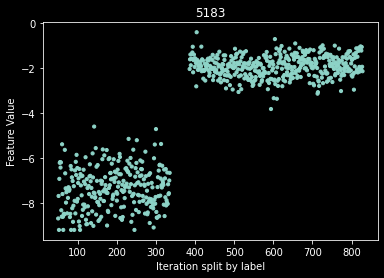

In [357]:
label1 = 9
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '5183'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: ovary  and  uterus
['1112', '7749', '8408', '9534', '13028', '11271']
[0, 0, 1, 0, 0, 1]


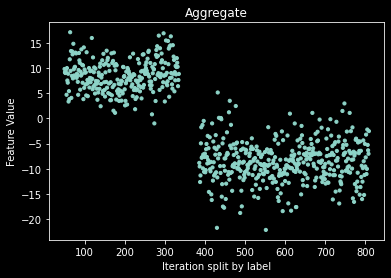

['4419', '12704', '7267', '6775', '5780', '7729']
[0, 0, 0, 0, 0, 0]


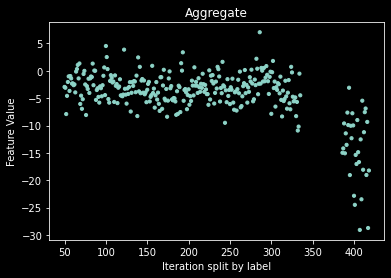

In [359]:
label1 = 9
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['1112', '7749', '8408', '9534', '13028', '11271']
reverse = [0, 0, 1, 0, 0, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = Aggregate(i, featurenamelist, reverse)

    if v > -3:

        tmpindexlist.append(i)
indexlist = tmpindexlist

featurenamelist = ['4419', '12704', '7267', '6775', '5780', '7729']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: pancreas  and  prostate


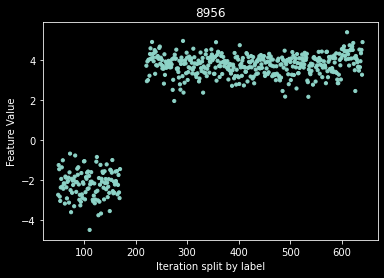

In [360]:
label1 = 10
label2 = 11
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8956'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: pancreas  and  sarcoma


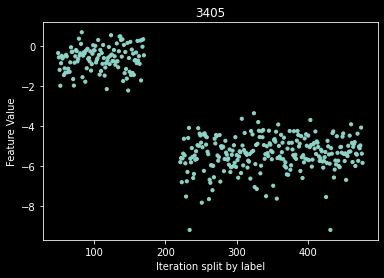

In [361]:
label1 = 10
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '3405'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: pancreas  and  squamous
['13556', '9162', '8490', '7964', '3578', '2752']
[0, 0, 0, 0, 0, 0]


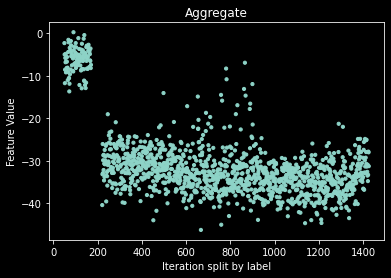

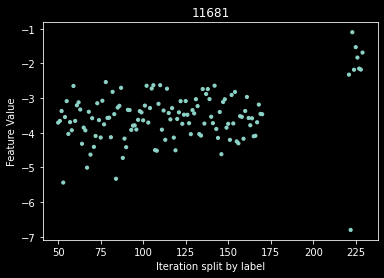

In [364]:
label1 = 10
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['13556', '9162', '8490', '7964', '3578', '2752']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = Aggregate(i, featurenamelist, reverse)

    if v > -15:

        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurename = '11681'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: pancreas  and  stomach
['3853', '7708', '4419', '7267', '12704', '3847']
[0, 0, 0, 0, 0, 0]


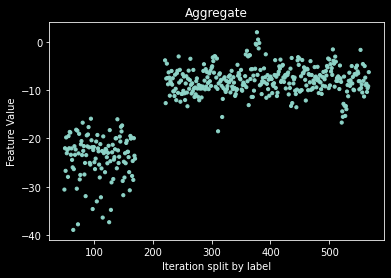

In [365]:
label1 = 10
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['3853', '7708', '4419', '7267', '12704', '3847']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: pancreas  and  testes


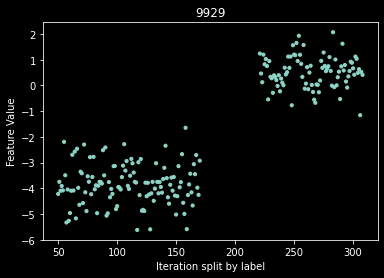

In [366]:
label1 = 10
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9929'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: pancreas  and  thymus


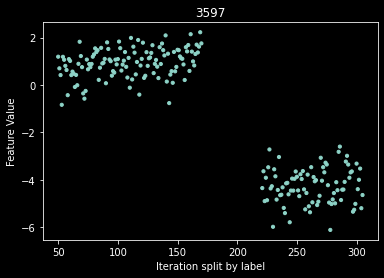

In [367]:
label1 = 10
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '3597'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: pancreas  and  thyroid


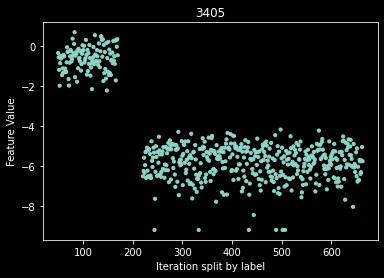

In [368]:
label1 = 10
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '3405'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: pancreas  and  uterus
['8723', '3578', '2118', '7179', '1358', '3234']
[0, 0, 0, 0, 0, 0]


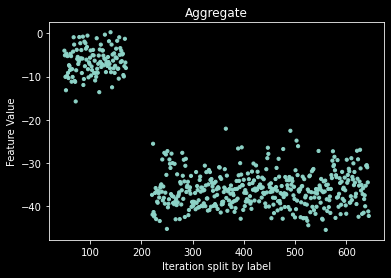

In [369]:
label1 = 10
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['8723', '3578', '2118', '7179', '1358', '3234']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: prostate  and  sarcoma


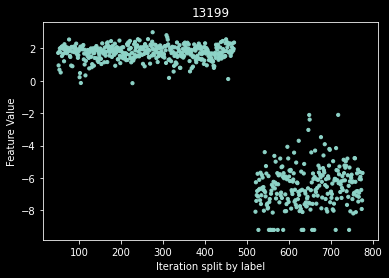

In [370]:
label1 = 11
label2 = 12
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '13199'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: prostate  and  squamous


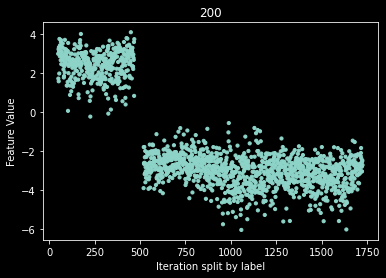

In [371]:
label1 = 11
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '200'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: prostate  and  stomach


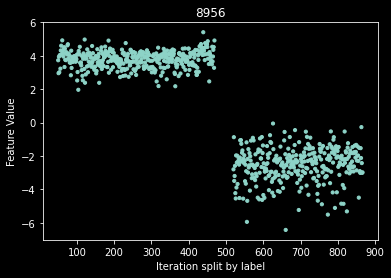

In [372]:
label1 = 11
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8956'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: prostate  and  testes


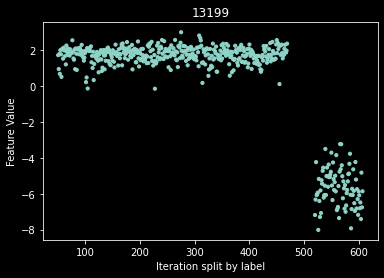

In [373]:
label1 = 11
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '13199'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: prostate  and  thymus


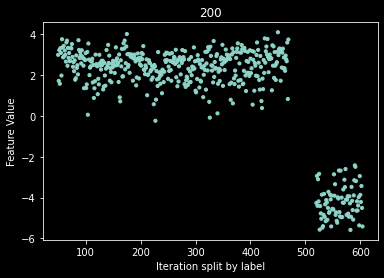

In [374]:
label1 = 11
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '200'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: prostate  and  thyroid


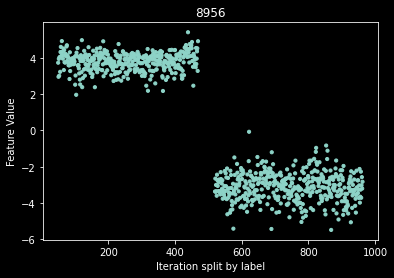

In [375]:
label1 = 11
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8956'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: prostate  and  uterus


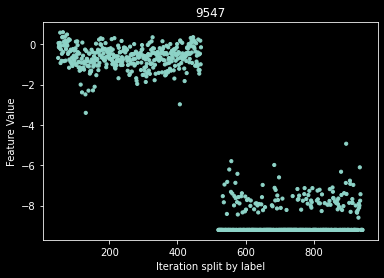

In [376]:
label1 = 11
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9547'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: sarcoma  and  squamous
i =  1000
i =  2000
i =  3000
i =  4000
i =  5000
i =  6000
i =  7000
i =  8000
i =  9000
i =  10000
i =  11000
i =  12000
i =  13000
Starting to print graphs
Top feature  1394  index  0
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


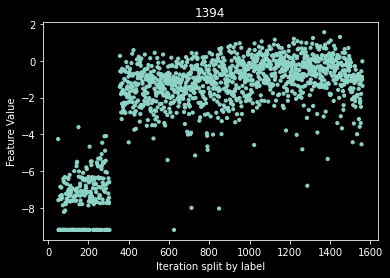

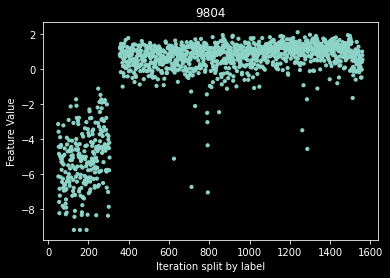

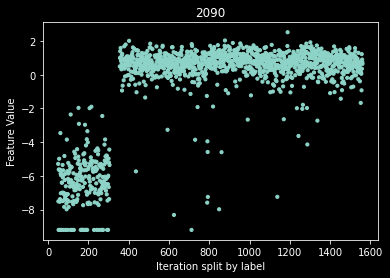

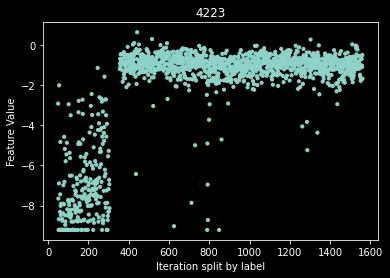

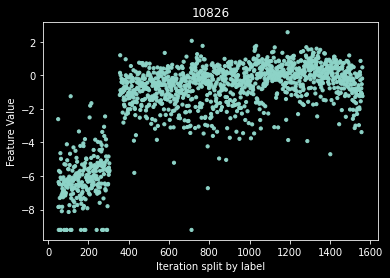

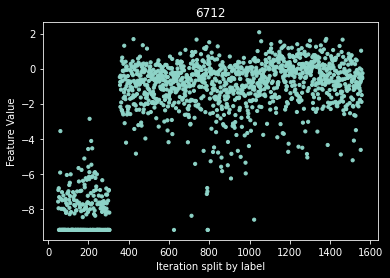

['1394', '9804', '2090', '4223', '10826', '6712']
[0, 0, 0, 0, 0, 0]


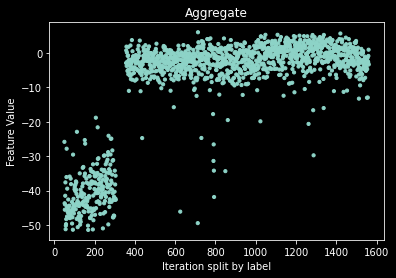

Top feature  9804  index  1
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


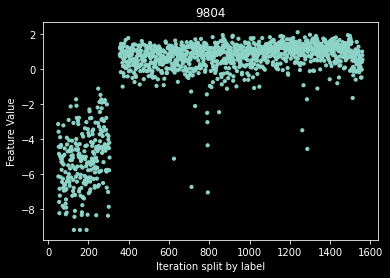

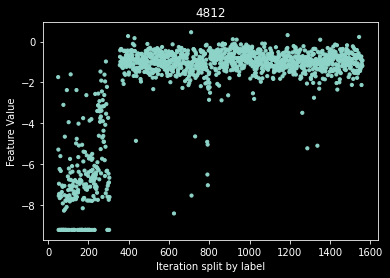

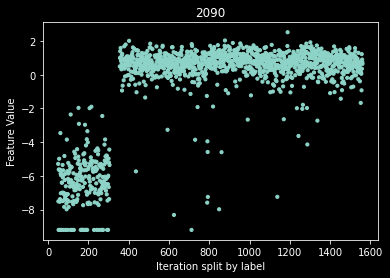

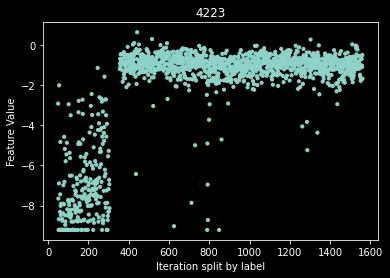

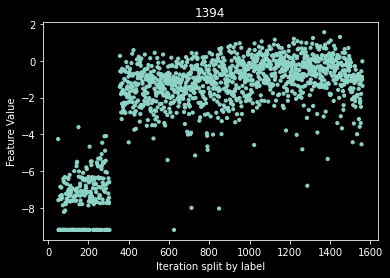

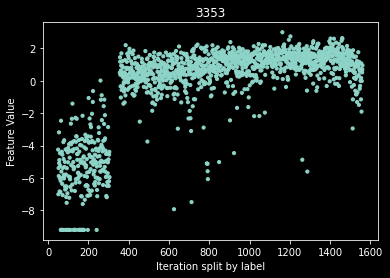

['9804', '4812', '2090', '4223', '1394', '3353']
[0, 0, 0, 0, 0, 0]


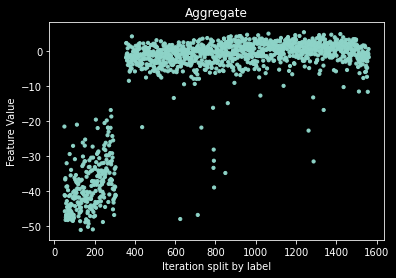

Top feature  2090  index  2
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


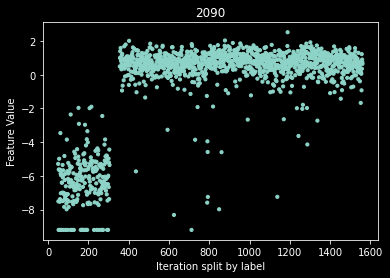

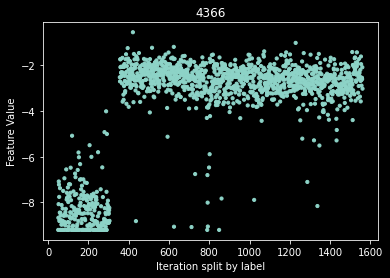

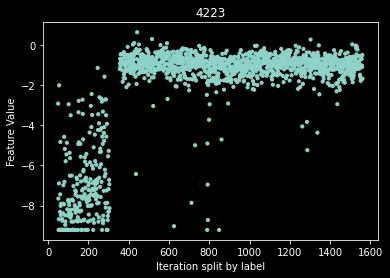

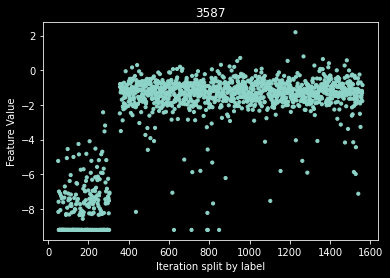

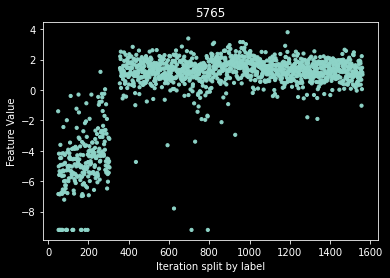

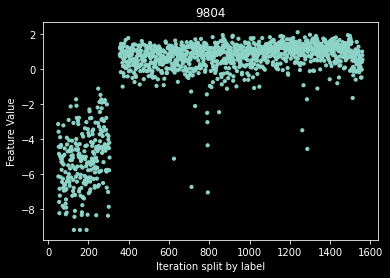

['2090', '4366', '4223', '3587', '5765', '9804']
[0, 0, 0, 0, 0, 0]


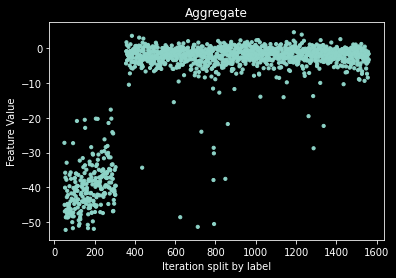

Top feature  9616  index  3
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


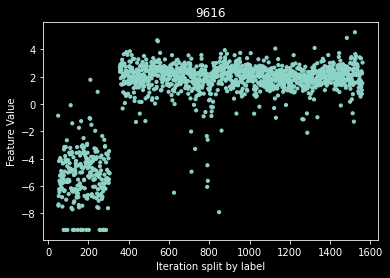

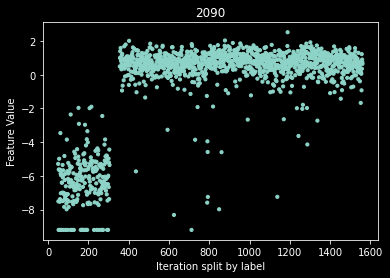

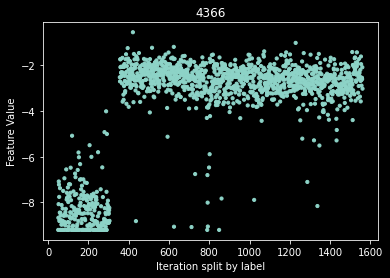

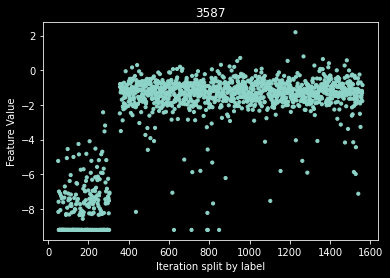

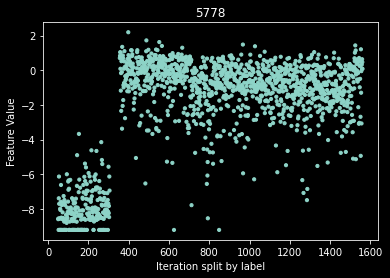

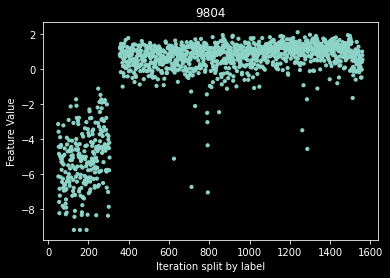

['9616', '2090', '4366', '3587', '5778', '9804']
[0, 0, 0, 0, 0, 0]


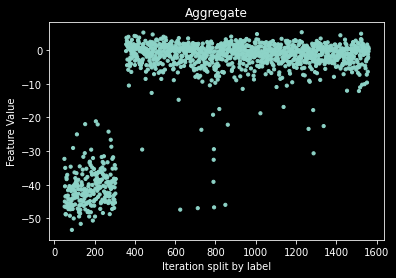

Top feature  4366  index  4
Correlation: 2000
Correlation: 4000
Correlation: 6000
Correlation: 8000
Correlation: 10000
Correlation: 12000


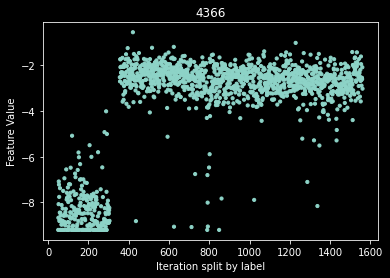

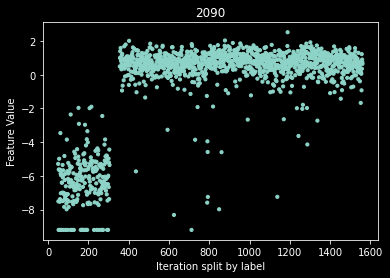

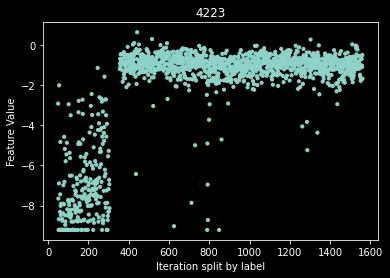

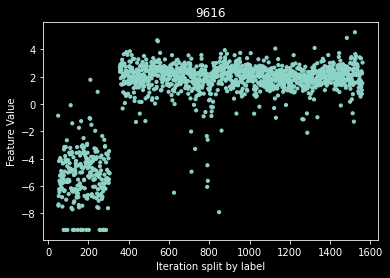

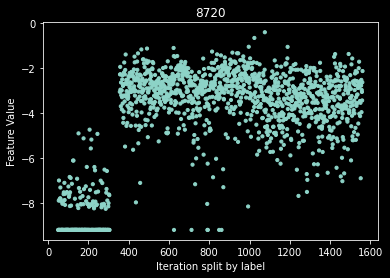

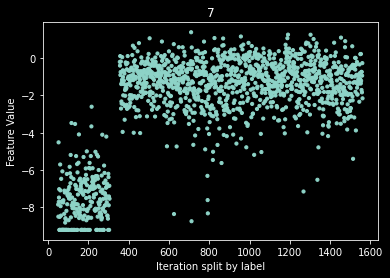

['4366', '2090', '4223', '9616', '8720', '7']
[0, 0, 0, 0, 0, 0]


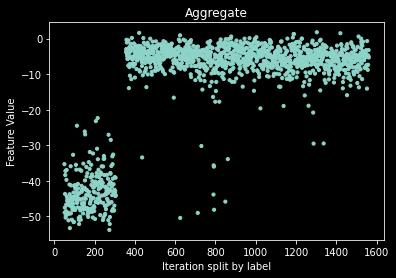

In [274]:
label1 = 12
label2 = 13
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

plottop5features(label1, label2, indexlist)

#first feature
featurename = '5703'
#graphpairfeature(featurename, label1, label2, indexlist)

#new value
featurenamelist = ['6431', '2975', '10602', '5681', '3463', '5503']
reverse = [0, 0, 0, 0, 0, 0]
#graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: sarcoma  and  stomach


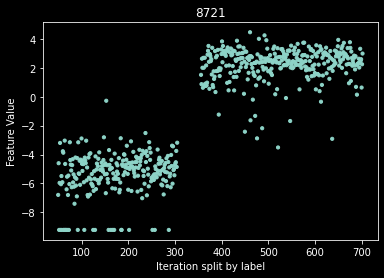

In [377]:
label1 = 12
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8721'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: sarcoma  and  testes


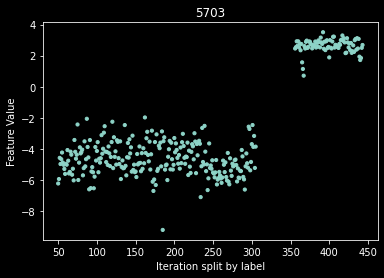

In [378]:
label1 = 12
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '5703'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: sarcoma  and  thymus
['5497', '2625', '12171', '1600', '8962', '1656']
[0, 0, 0, 0, 0, 0]


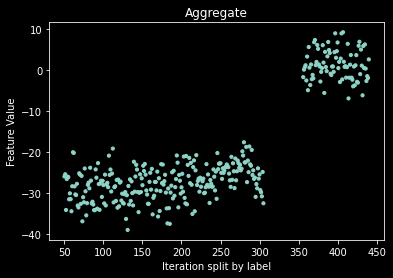

In [379]:
label1 = 12
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['5497', '2625', '12171', '1600', '8962', '1656']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: sarcoma  and  thyroid


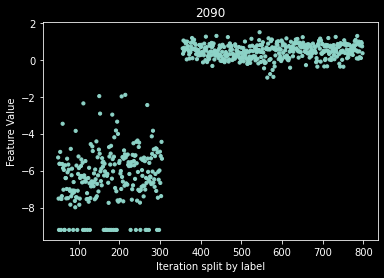

In [380]:
label1 = 12
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2090'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: sarcoma  and  uterus
['11928', '443', '8720', '2090', '6712', '4366']
[0, 0, 0, 0, 0, 0]


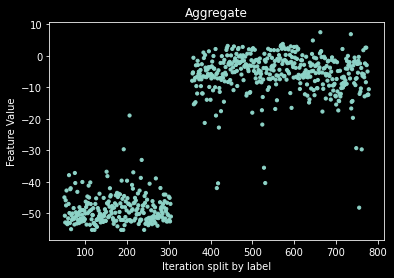

In [381]:
label1 = 12
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['11928', '443', '8720', '2090', '6712', '4366']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: squamous  and  stomach


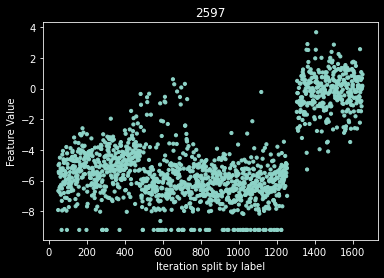

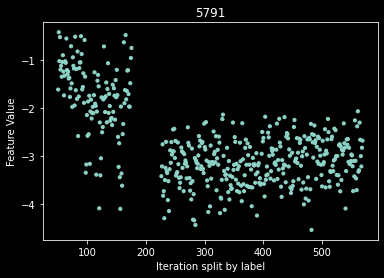

['4317', '4366', '4224', '9578', '3692', '6712']
[0, 0, 0, 0, 0, 0]


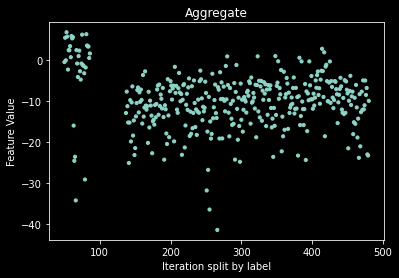

In [11]:
label1 = 13
label2 = 14
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '2597'
graphpairfeature(featurename, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]

    if v > -4:

        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurename = '5791'
graphpairfeature(featurename, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = list(df[featurename])[i]

    if v < -2:

        tmpindexlist.append(i)
indexlist = tmpindexlist

#new value
featurenamelist = ['4317', '4366', '4224', '9578', '3692', '6712']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: squamous  and  testes


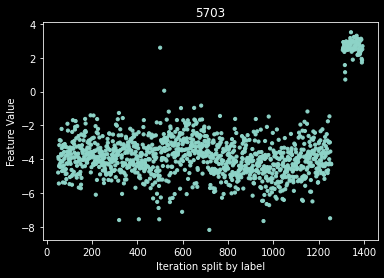

In [12]:
label1 = 13
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])


#first feature
featurename = '5703'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: squamous  and  thymus


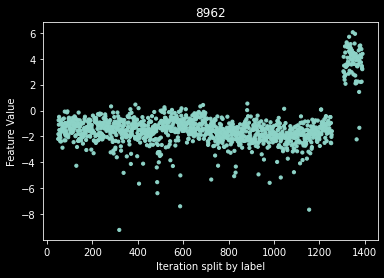

In [13]:
label1 = 13
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '8962'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: squamous  and  thyroid
['268', '10045', '178', '10160', '13076', '5651']
[0, 1, 0, 0, 1, 1]


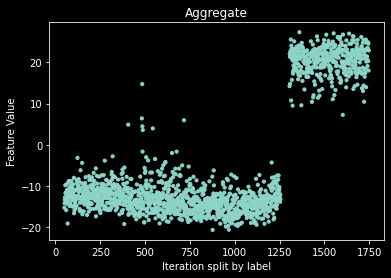

In [30]:
label1 = 13
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['268', '10045', '178', '10160', '13076', '5651']
reverse = [0, 1, 0, 0, 1, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: squamous  and  uterus
['12160', '11532', '13196', '1862', '6288', '443']
[0, 1, 1, 0, 1, 0]


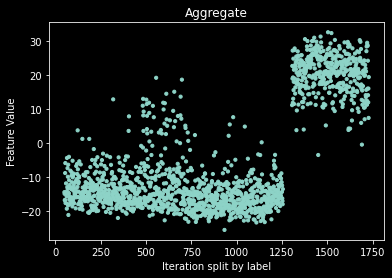

['5547', '12160', '268', '8489', '2266', '2139']
[0, 0, 0, 0, 0, 0]


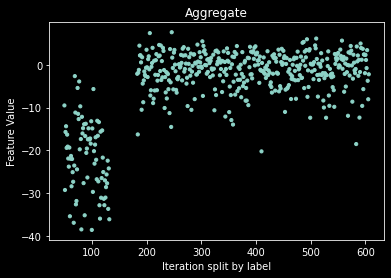

In [16]:
label1 = 13
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['12160', '11532', '13196', '1862', '6288', '443']
reverse = [0, 1, 1, 0, 1, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

#split
tmpindexlist = list()
for i in indexlist:
    v = Aggregate(i, featurenamelist, reverse)

    if v > -5:

        tmpindexlist.append(i)
indexlist = tmpindexlist

featurenamelist = ['5547', '12160', '268', '8489', '2266', '2139']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: stomach  and  testes


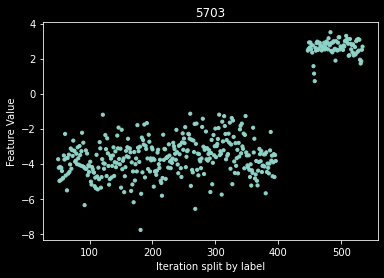

In [17]:
label1 = 14
label2 = 15
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '5703'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: stomach  and  thymus


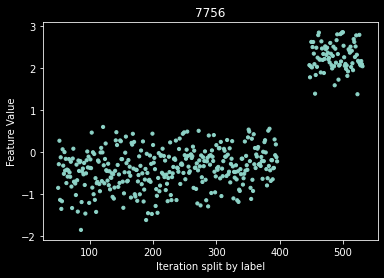

In [19]:
label1 = 14
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '7756'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: stomach  and  thyroid


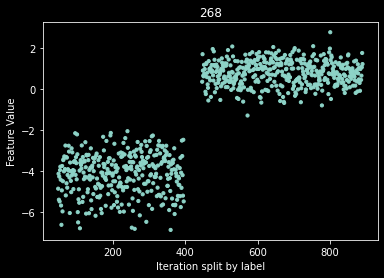

In [20]:
label1 = 14
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '268'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: stomach  and  uterus
['268', '5547', '1500', '9274', '8661', '9884']
[0, 0, 0, 0, 0, 0]


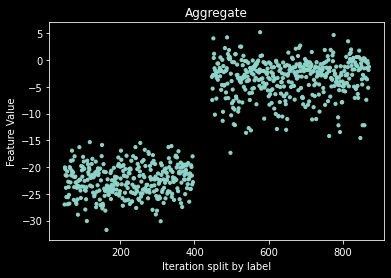

In [21]:
label1 = 14
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['268', '5547', '1500', '9274', '8661', '9884']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: testes  and  thymus


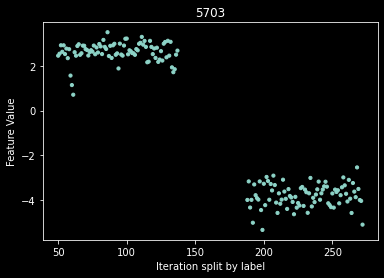

In [22]:
label1 = 15
label2 = 16
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '5703'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: testes  and  thyroid


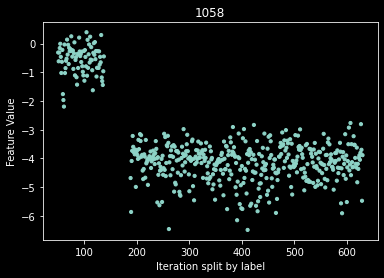

In [23]:
label1 = 15
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '1058'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: testes  and  uterus


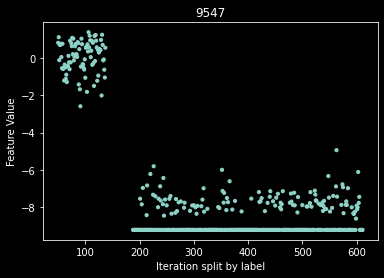

In [24]:
label1 = 15
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '9547'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: thymus  and  thyroid


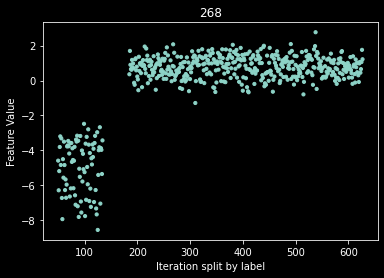

In [25]:
label1 = 16
label2 = 17
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#first feature
featurename = '268'
graphpairfeature(featurename, label1, label2, indexlist)

Labels being compared: thymus  and  uterus
['5497', '8289', '584', '4085', '8285', '5843']
[0, 0, 0, 0, 0, 0]


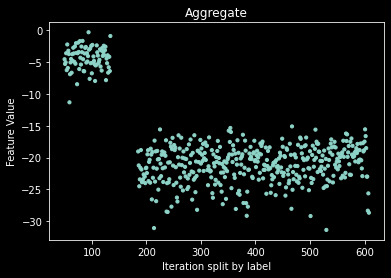

In [26]:
label1 = 16
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['5497', '8289', '584', '4085', '8285', '5843']
reverse = [0, 0, 0, 0, 0, 0]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

Labels being compared: thyroid  and  uterus
['9802', '4197', '5183', '13199', '2266', '7414']
[0, 0, 0, 1, 1, 1]


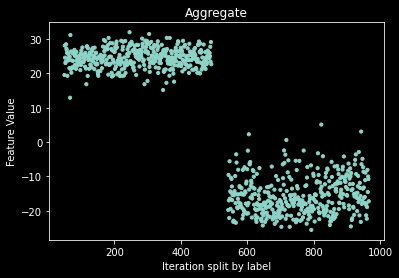

In [27]:
label1 = 17
label2 = 18
indexlist = NarrowToTwoLabels(label1, label2)
print("Labels being compared:", labelnames[label1], " and ", labelnames[label2])

#new value
featurenamelist = ['9802', '4197', '5183', '13199', '2266', '7414']
reverse = [0, 0, 0, 1, 1, 1]
graphpairaggregate(featurenamelist, reverse, label1, label2, indexlist)

In [151]:
#Adrenal 0
#Brain 1
#Breast 2
#Colorectal 3
#Kidney 4
#Leukemia 5
#Liver 6
#Lung 7
#Melanoma 8
#Ovary 9
#Pancreas 10
#Prostate 11
#Sarcoma 12
#Squamous 13
#Stomach 14
#Testis 15
#Thymus 16
#Thyroid 17
#Uterus 18
